# Python Clustering

In [1]:
import datetime
print(datetime.datetime.now())

2020-03-21 20:24:27.869489


In [2]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

from sklearn.metrics import silhouette_score, silhouette_samples
import sklearn.metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

import itertools

import scipy


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


# Read in Data

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/stepthom/sandbox/master/data/Mall_Customers.csv")

df = df.rename(index=str, columns={"Genre": "Male"})
df['Male'] = df['Male'].replace(['Male', 'Female'], [True, False])

list(df)
df.shape
df.info()
df.describe().transpose()
df.head(n=20)
df.tail()

['CustomerID', 'Male', 'Age', 'AnnualIncome', 'SpendingScore']

(200, 5)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 5 columns):
CustomerID       200 non-null int64
Male             200 non-null bool
Age              200 non-null int64
AnnualIncome     200 non-null int64
SpendingScore    200 non-null int64
dtypes: bool(1), int64(4)
memory usage: 8.0+ KB


,count,mean,std,min,25%,50%,75%,max
CustomerID,200.0,100.50,57.879185,1.0,50.75,100.5,150.25,200.0
Age,200.0,38.85,13.969007,18.0,28.75,36.0,49.00,70.0
AnnualIncome,200.0,60.56,26.264721,15.0,41.50,61.5,78.00,137.0
SpendingScore,200.0,50.20,25.823522,1.0,34.75,50.0,73.00,99.0


,CustomerID,Male,Age,AnnualIncome,SpendingScore
0,1,True,19,15,39
1,2,True,21,15,81
2,3,False,20,16,6
3,4,False,23,16,77
4,5,False,31,17,40
5,6,False,22,17,76
6,7,False,35,18,6
7,8,False,23,18,94
8,9,True,64,19,3
9,10,False,30,19,72


,CustomerID,Male,Age,AnnualIncome,SpendingScore
195,196,False,35,120,79
196,197,False,45,126,28
197,198,True,32,126,74
198,199,True,32,137,18
199,200,True,30,137,83


# Normalize the Data

In [4]:
X = df.copy()
X = X.drop(['CustomerID', 'Age', 'Male'], axis=1)
X.head(10)

,AnnualIncome,SpendingScore
0,15,39
1,15,81
2,16,6
3,16,77
4,17,40
5,17,76
6,18,6
7,18,94
8,19,3
9,19,72


In [5]:
scaler = StandardScaler()
features = ['AnnualIncome', 'SpendingScore']
X[features] = scaler.fit_transform(X[features])

In [6]:
X.shape
X.info()
X.describe().transpose()
X.head(10)
X.tail()

(200, 2)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 2 columns):
AnnualIncome     200 non-null float64
SpendingScore    200 non-null float64
dtypes: float64(2)
memory usage: 4.7+ KB


,count,mean,std,min,25%,50%,75%,max
AnnualIncome,200.0,-2.131628e-16,1.002509,-1.738999,-0.727509,0.035879,0.665675,2.917671
SpendingScore,200.0,-1.465494e-16,1.002509,-1.910021,-0.599793,-0.007764,0.885132,1.894492


,AnnualIncome,SpendingScore
0,-1.738999,-0.434801
1,-1.738999,1.195704
2,-1.700830,-1.715913
3,-1.700830,1.040418
4,-1.662660,-0.395980
5,-1.662660,1.001596
6,-1.624491,-1.715913
7,-1.624491,1.700384
8,-1.586321,-1.832378
9,-1.586321,0.846310


,AnnualIncome,SpendingScore
195,2.268791,1.118061
196,2.497807,-0.861839
197,2.497807,0.923953
198,2.917671,-1.250054
199,2.917671,1.273347


## Plot the Data

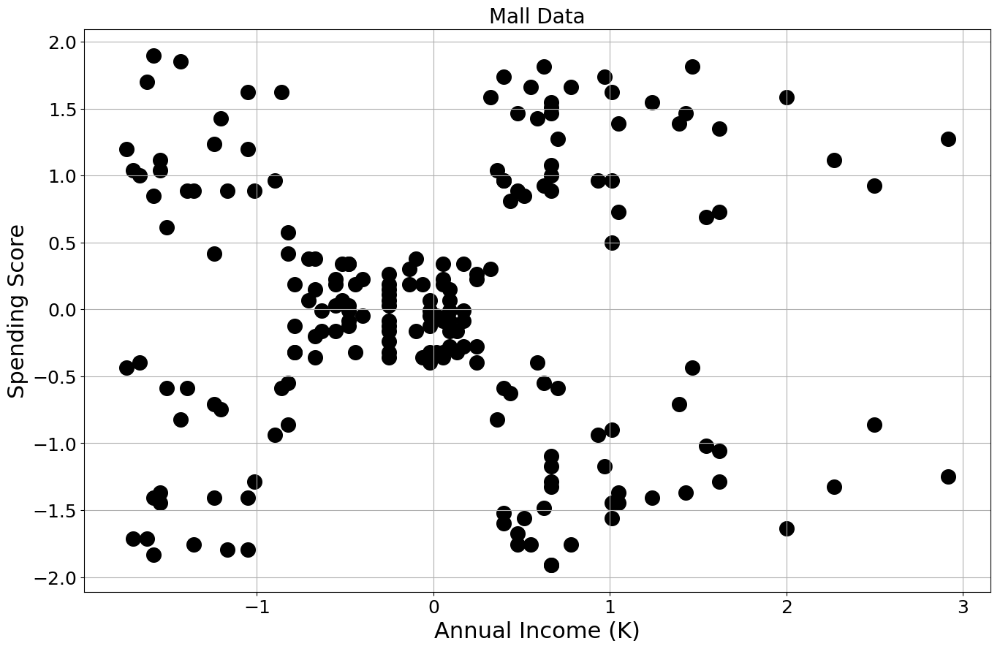

In [7]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c="black", s=200);
plt.title("Mall Data", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

# K-Means

In [8]:
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
k_means.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [9]:
k_means.labels_

array([2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3,
       2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 0,
       2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 1, 4, 0, 4, 1, 4, 1, 4,
       0, 4, 1, 4, 1, 4, 1, 4, 1, 4, 0, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4])

In [10]:
# Let's look at the centers
k_means.cluster_centers_

array([[-0.20091257, -0.02645617],
       [ 1.05500302, -1.28443907],
       [-1.30751869, -1.13696536],
       [-1.32954532,  1.13217788],
       [ 0.99158305,  1.23950275]])

# Plot the Clusters

<Figure size 1600x1000 with 0 Axes>

Text(0.5, 1.0, 'K-Means (K=5)')

Text(0.5, 0, 'Annual Income (K)')

Text(0, 0.5, 'Spending Score')

(array([-2., -1.,  0.,  1.,  2.,  3.,  4.]),
 <a list of 7 Text xticklabel objects>)

(array([-2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5]),
 <a list of 11 Text yticklabel objects>)

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-1.3075186893850437, -1.1369653606646668, '2')

Text(-1.329545316496027, 1.132177879659924, '3')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(-0.20091256569971447, -0.02645617470711759, '0')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

Text(1.0550030223077878, -1.2844390658272284, '1')

Text(0.9915830476839198, 1.2395027537948333, '4')

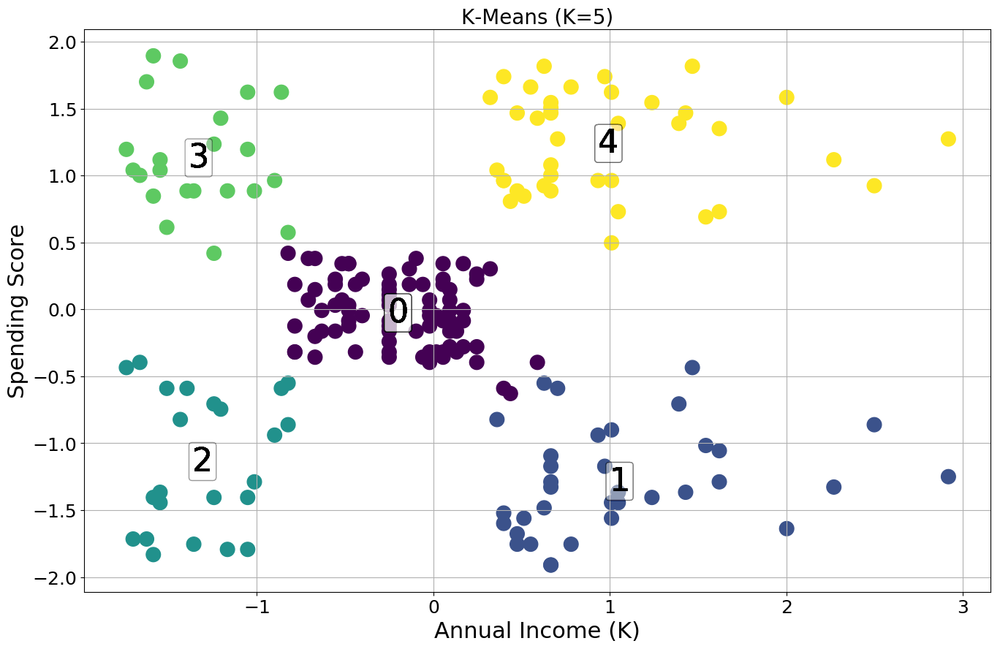

In [11]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

sc = plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=k_means.labels_);
#plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")
plt.title("K-Means (K=5)", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));


## Internal Validation Metrics

In [12]:
# WCSS == Inertia
k_means.inertia_

65.56840815571681

In [13]:
silhouette_score(X, k_means.labels_)

0.5546571631111091

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


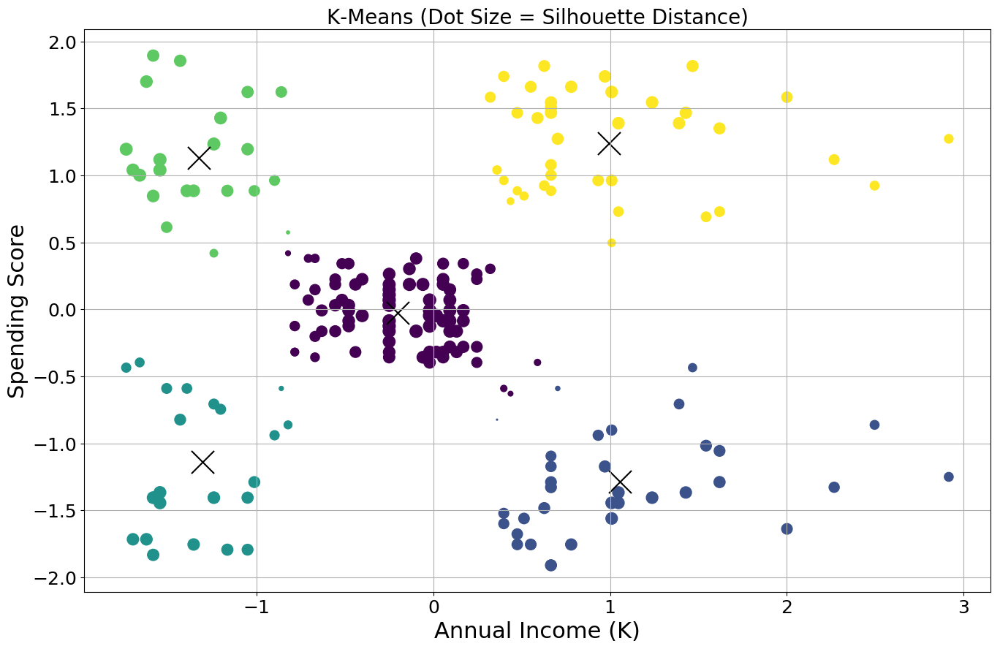

In [14]:
plt.style.use('default');

sample_silhouette_values = silhouette_samples(X, k_means.labels_)
sizes = 200*sample_silhouette_values

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

plt.title("K-Means (Dot Size = Silhouette Distance)", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

## Elbow Method (Manual)

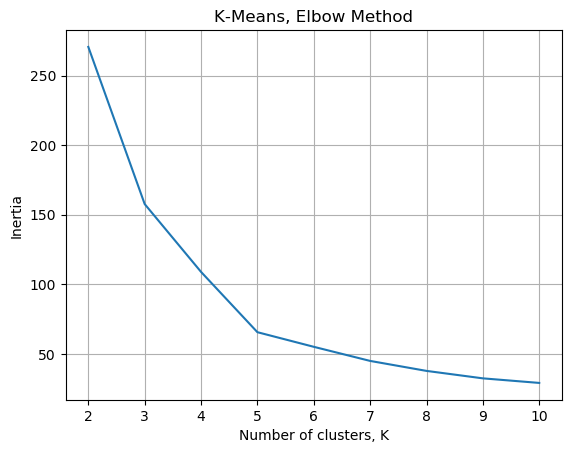

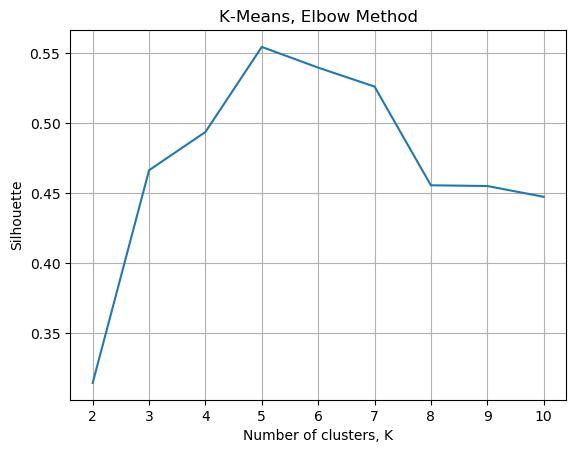

In [15]:
inertias = {}
silhouettes = {}
for k in range(2, 11):
    kmeans = KMeans(init='k-means++', n_init=10, n_clusters=k, max_iter=1000, random_state=42).fit(X)
    inertias[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    silhouettes[k] = silhouette_score(X, kmeans.labels_, metric='euclidean')
    

plt.figure();
plt.grid(True);
plt.plot(list(inertias.keys()), list(inertias.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Inertia");


plt.figure();
plt.grid(True);
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Silhouette");

## Intepretting the Clusters

### Means

In [16]:
k_means.cluster_centers_

array([[-0.20091257, -0.02645617],
       [ 1.05500302, -1.28443907],
       [-1.30751869, -1.13696536],
       [-1.32954532,  1.13217788],
       [ 0.99158305,  1.23950275]])

In [17]:
for label in set(k_means.labels_):
    print('\nCluster {}:'.format(label))
    X_tmp = X[k_means.labels_==label].copy()
    X_tmp.loc['mean'] = X_tmp.mean()
    X_tmp.tail(13)
    


Cluster 0:


,AnnualIncome,SpendingScore
114,0.169472,-0.085407
115,0.169472,-0.007764
116,0.169472,-0.279515
117,0.169472,0.341630
118,0.245811,-0.279515
119,0.245811,0.263987
120,0.245811,0.225165
121,0.245811,-0.395980
122,0.322150,0.302808
126,0.398489,-0.590088



Cluster 1:


,AnnualIncome,SpendingScore
176,1.047369,-1.366519
178,1.238216,-1.405340
180,1.390894,-0.706552
182,1.429063,-1.366519
184,1.467233,-0.434801
186,1.543572,-1.017125
188,1.619911,-1.288876
190,1.619911,-1.055946
192,2.001605,-1.638270
194,2.268791,-1.327697



Cluster 2:


,AnnualIncome,SpendingScore
22,-1.357305,-1.754735
24,-1.242797,-1.405340
26,-1.242797,-0.706552
28,-1.204627,-0.745374
30,-1.166458,-1.793556
32,-1.051949,-1.793556
34,-1.051949,-1.405340
36,-1.013780,-1.288876
38,-0.899272,-0.939482
40,-0.861102,-0.590088



Cluster 3:


,AnnualIncome,SpendingScore
21,-1.395474,0.885132
23,-1.357305,0.885132
25,-1.242797,1.234526
27,-1.242797,0.419273
29,-1.204627,1.428633
31,-1.166458,0.885132
33,-1.051949,1.622741
35,-1.051949,1.195704
37,-1.013780,0.885132
39,-0.899272,0.962775



Cluster 4:


,AnnualIncome,SpendingScore
177,1.047369,0.729845
179,1.238216,1.545098
181,1.390894,1.389812
183,1.429063,1.467455
185,1.467233,1.816849
187,1.543572,0.691024
189,1.619911,1.350990
191,1.619911,0.729845
193,2.001605,1.583920
195,2.268791,1.118061


# Find Examplars

Let's find the observation that is closest to the cluster center

In [18]:
from scipy.spatial import distance

for i, label in enumerate(set(k_means.labels_)):    
    X_tmp = X[k_means.labels_==label].copy()
    
    exemplar_idx = distance.cdist([k_means.cluster_centers_[i]], X_tmp).argmin()
    exemplar = pd.DataFrame(X_tmp.iloc[exemplar_idx])
   
    print('\nCluster {}:'.format(label))
    exemplar


Cluster 0:


,80
AnnualIncome,-0.250391
SpendingScore,0.031057



Cluster 1:


,176
AnnualIncome,1.047369
SpendingScore,-1.366519



Cluster 2:


,24
AnnualIncome,-1.242797
SpendingScore,-1.405340



Cluster 3:


,25
AnnualIncome,-1.242797
SpendingScore,1.234526



Cluster 4:


,175
AnnualIncome,1.047369
SpendingScore,1.389812


### Snake Plot

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


Text(0.5, 1.0, 'Snake Plot, K-Means, K=5')

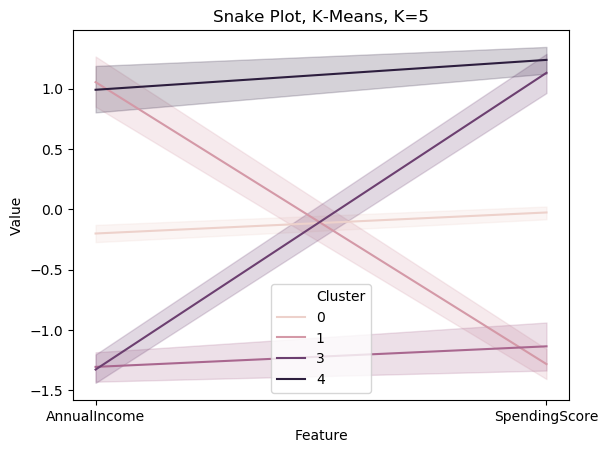

In [19]:
import seaborn as sns
dat = X.copy()

dat['Cluster'] = k_means.labels_

datamart_melt = pd.melt(dat.reset_index(),
id_vars=['Cluster'],
value_vars=['AnnualIncome','SpendingScore'],
var_name='Feature',
value_name='Value')

plt.title('Snake Plot, K-Means, K=5')
sns.lineplot(x="Feature", y="Value", hue='Cluster', data=datamart_melt)

# Relative Importance Plots

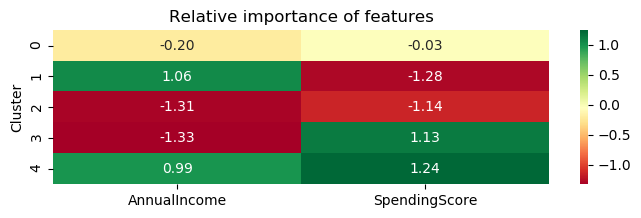

In [20]:
cluster_avg = dat.groupby(['Cluster']).mean()
population_avg = dat.drop(['Cluster'], axis=1).mean()

relative_imp = cluster_avg - population_avg

plt.figure(figsize=(8, 2));
plt.title('Relative importance of features');
sns.heatmap(data=relative_imp, annot=True, fmt='.2f', cmap='RdYlGn');

## Experiment with Lots of Ks

In [21]:
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
k_means.fit(X)

distances = k_means.fit_transform(X)
variance = 0
i = 0

for label in k_means.labels_:
    variance = variance + distances[i][label]
    i = i + 1

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


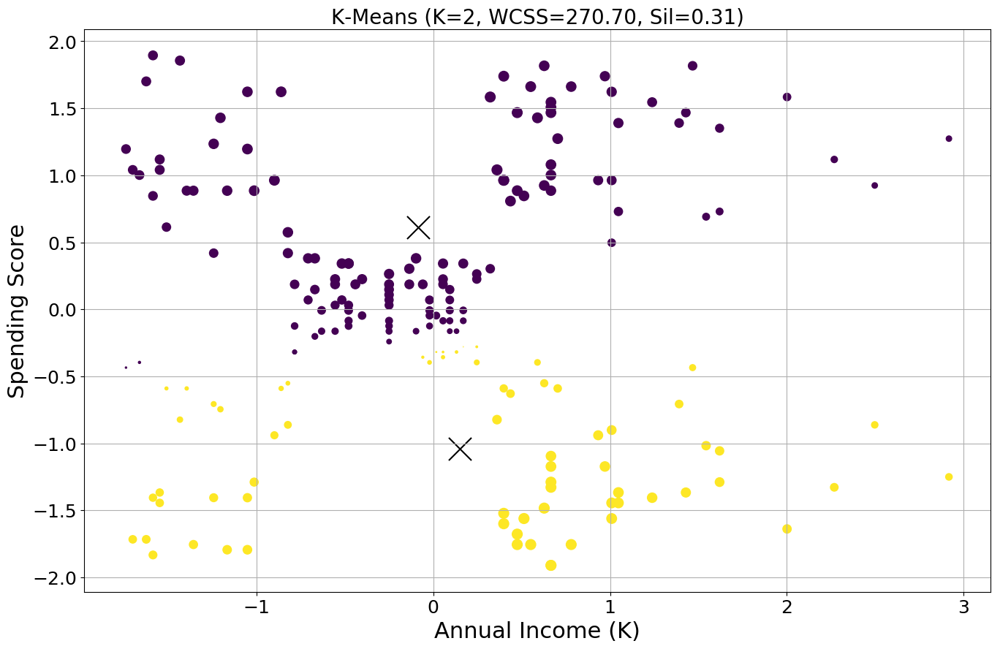

K=2, WCSS=270.70, Sil=0.31


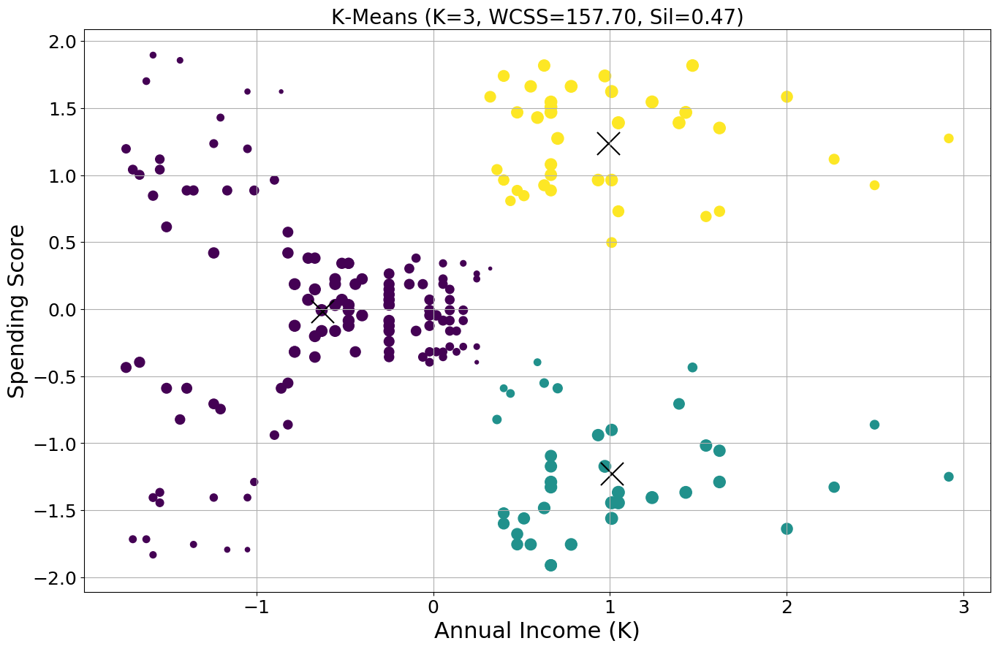

K=3, WCSS=157.70, Sil=0.47


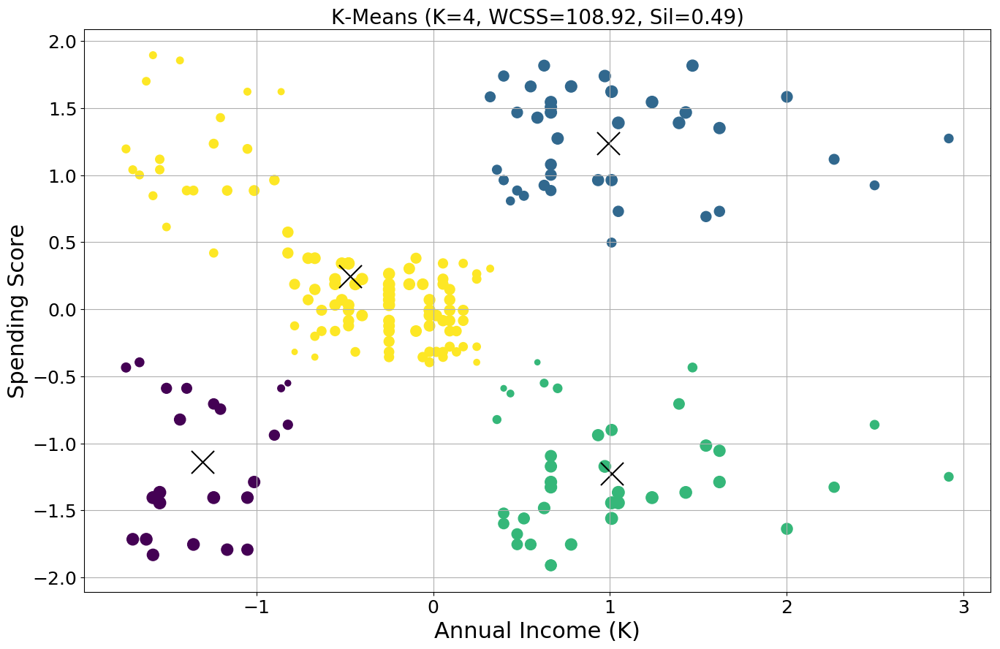

K=4, WCSS=108.92, Sil=0.49


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


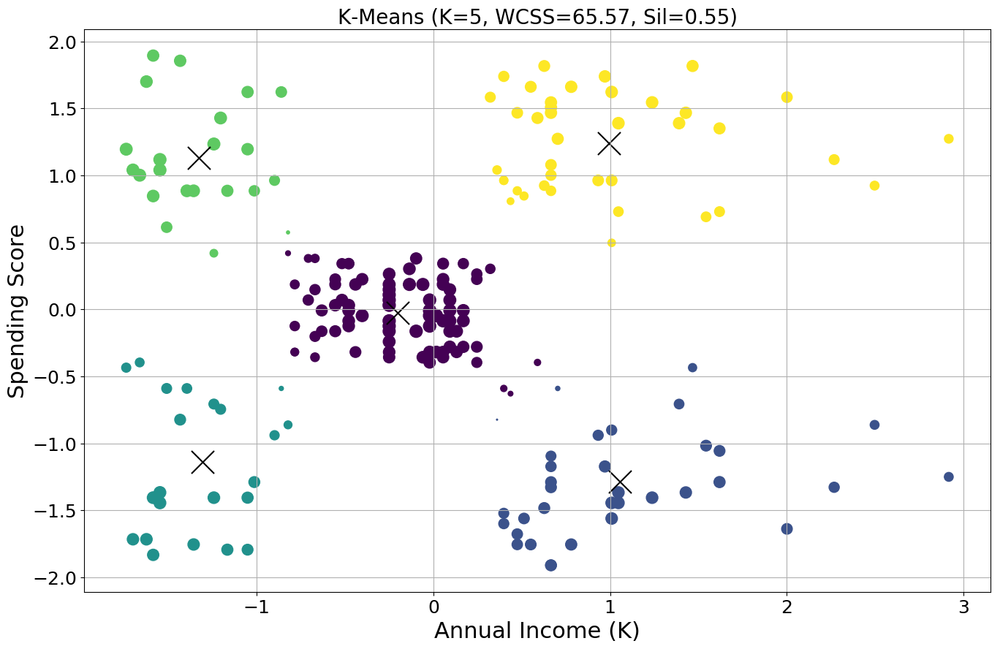

K=5, WCSS=65.57, Sil=0.55


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


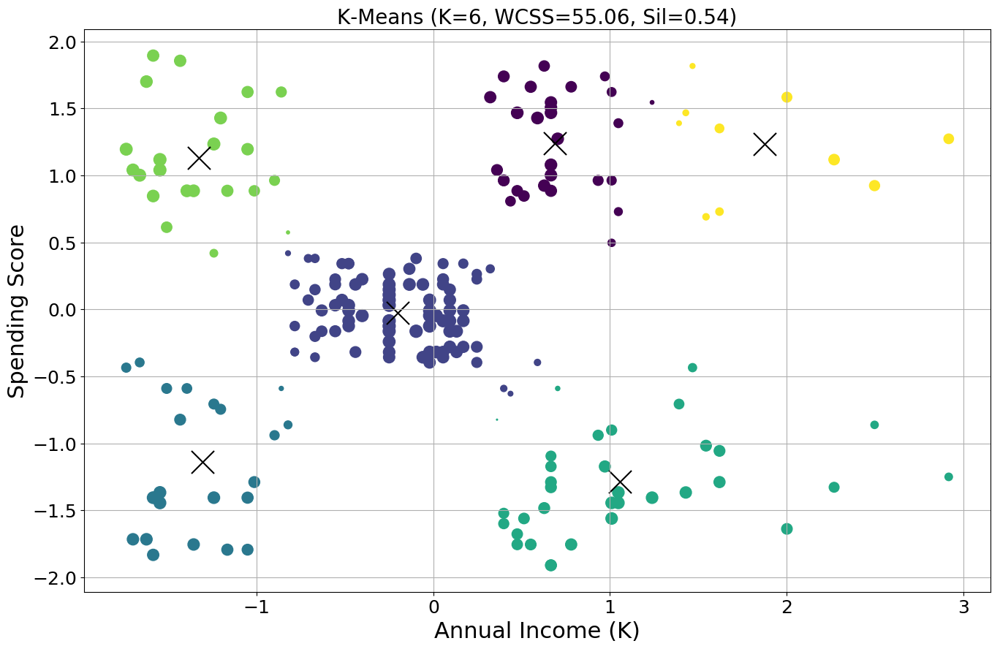

K=6, WCSS=55.06, Sil=0.54


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


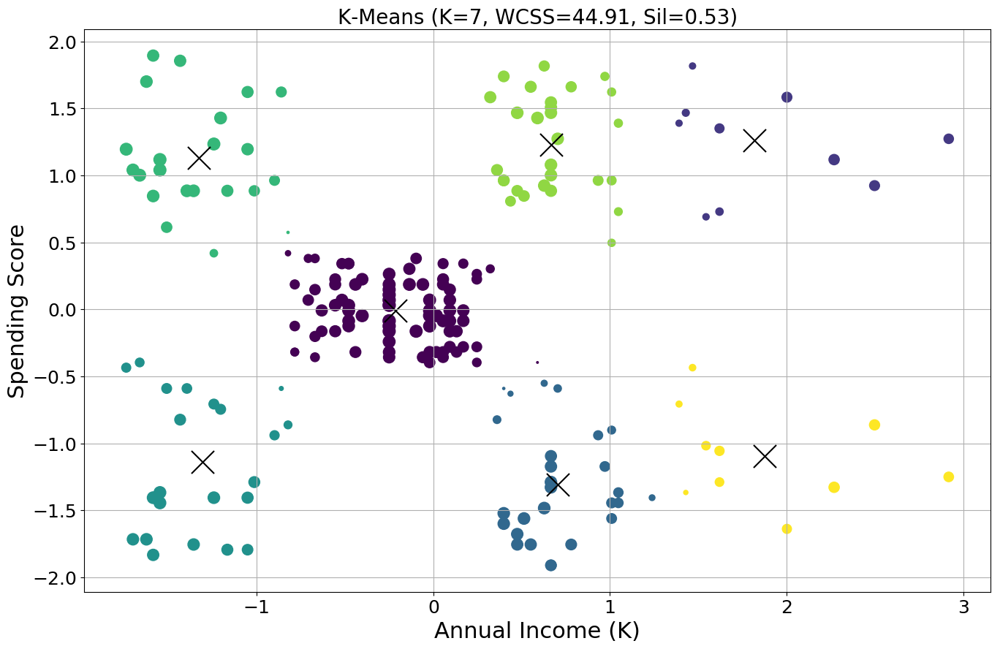

K=7, WCSS=44.91, Sil=0.53


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


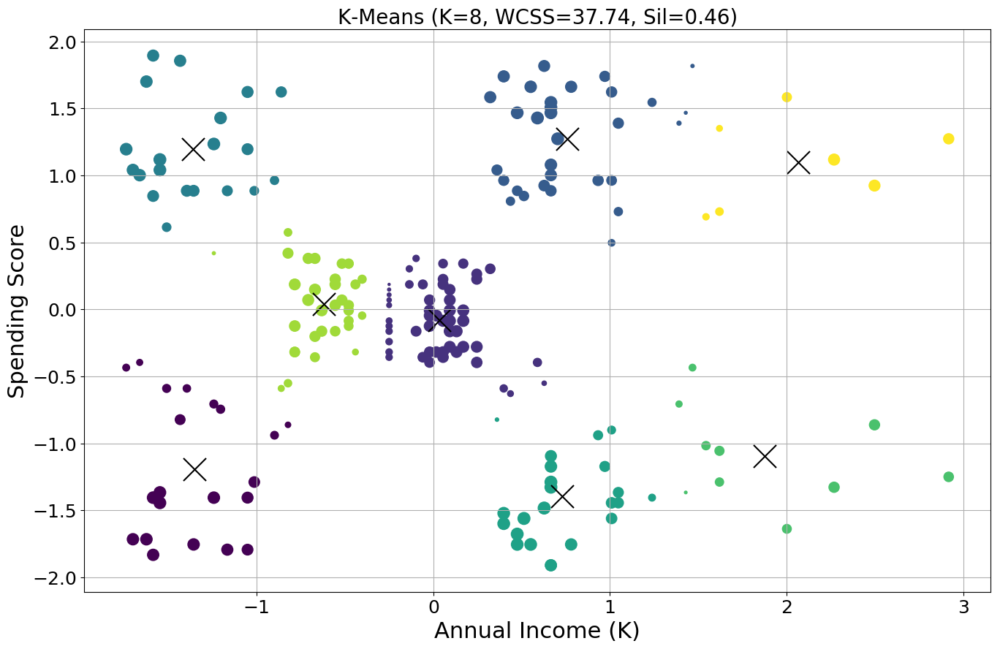

K=8, WCSS=37.74, Sil=0.46


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


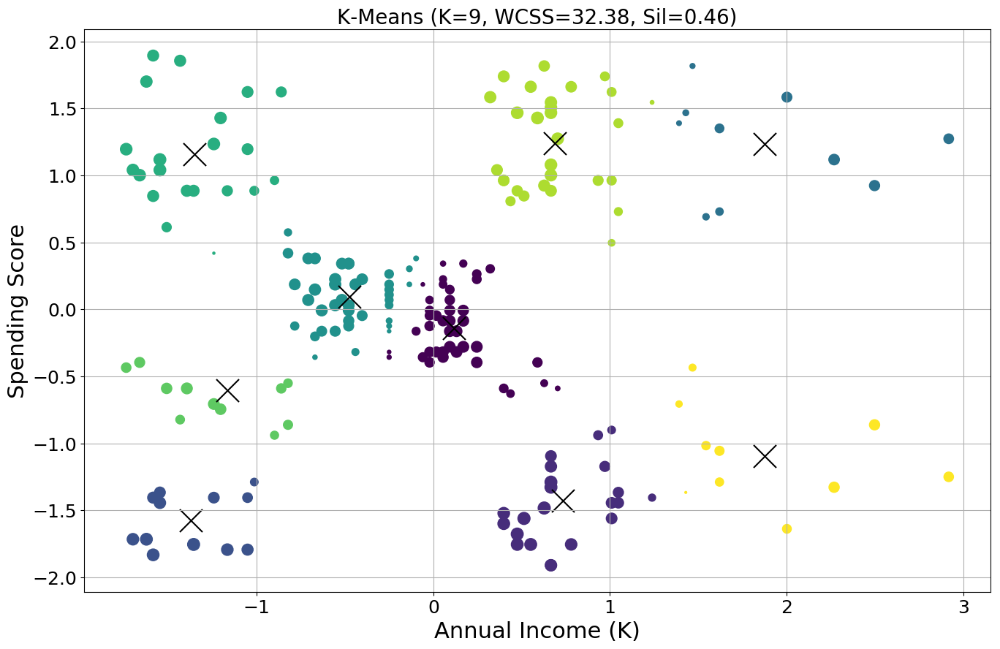

K=9, WCSS=32.38, Sil=0.46


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


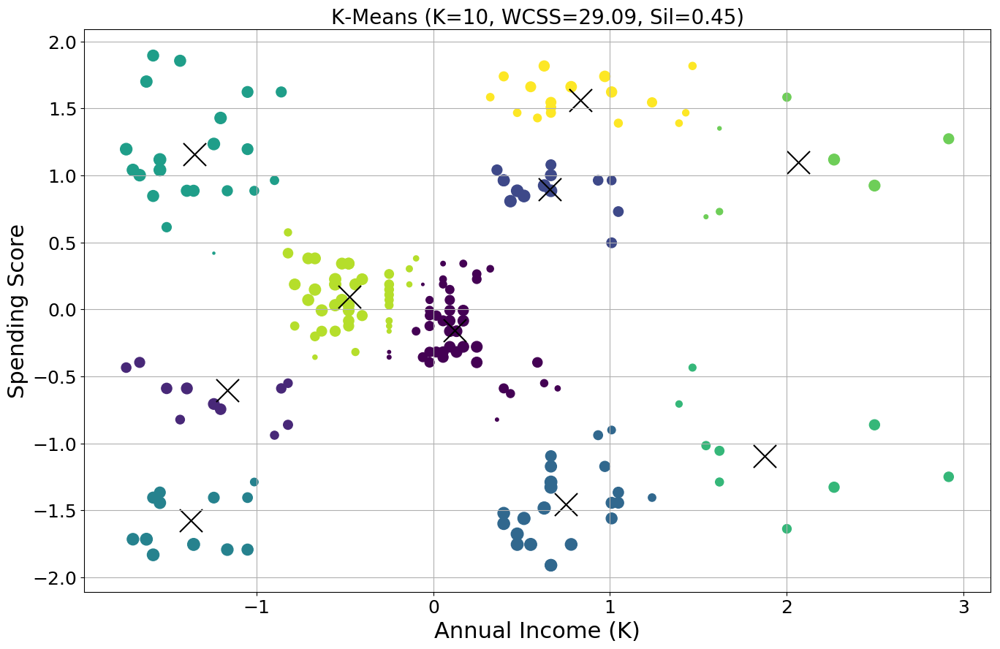

K=10, WCSS=29.09, Sil=0.45


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


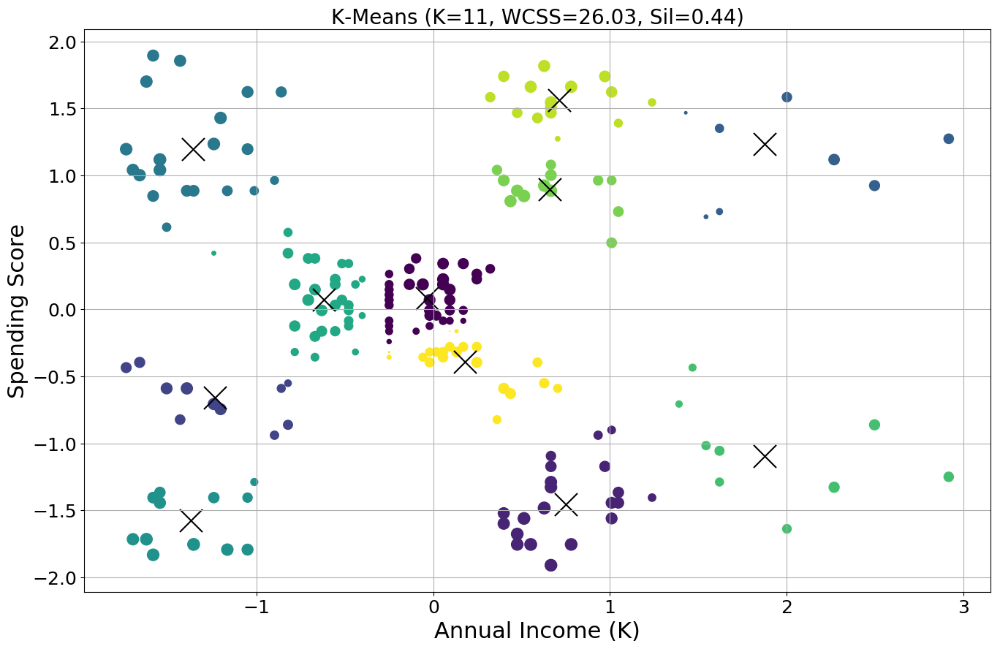

K=11, WCSS=26.03, Sil=0.44


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


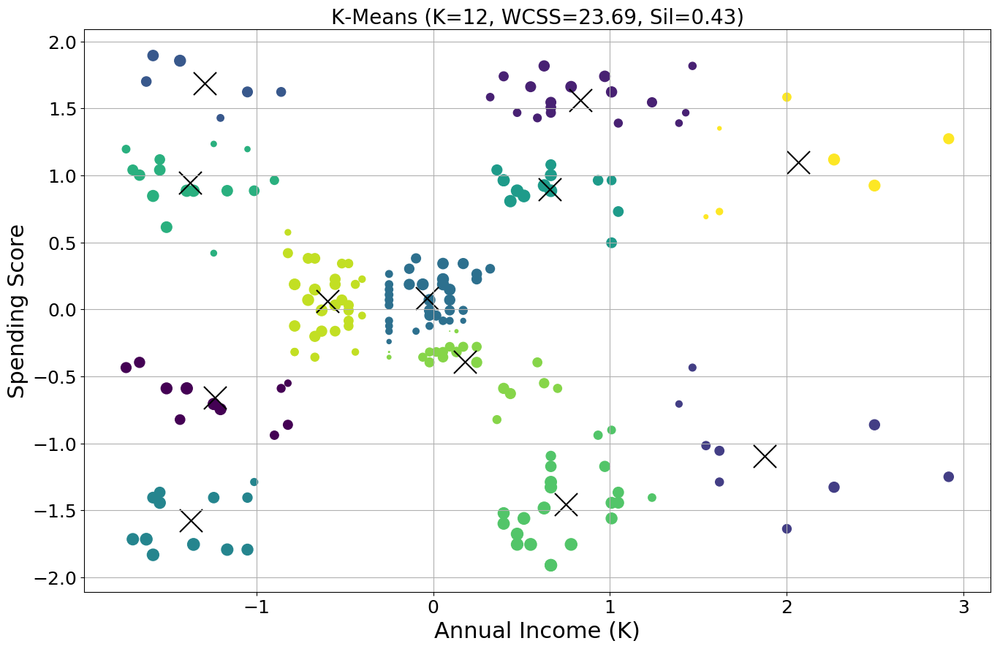

K=12, WCSS=23.69, Sil=0.43


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


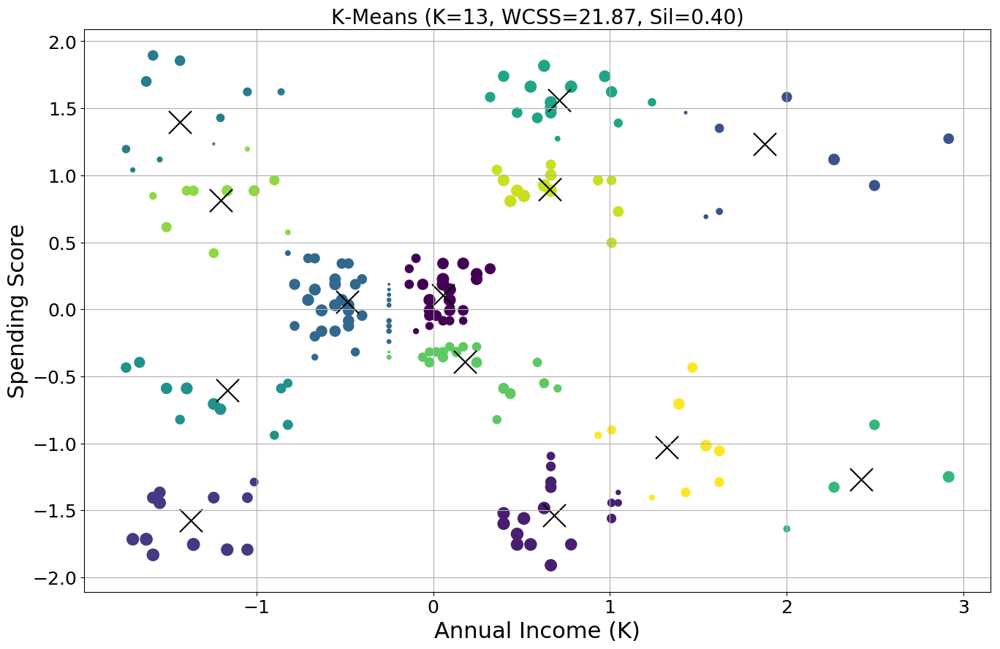

K=13, WCSS=21.87, Sil=0.40


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


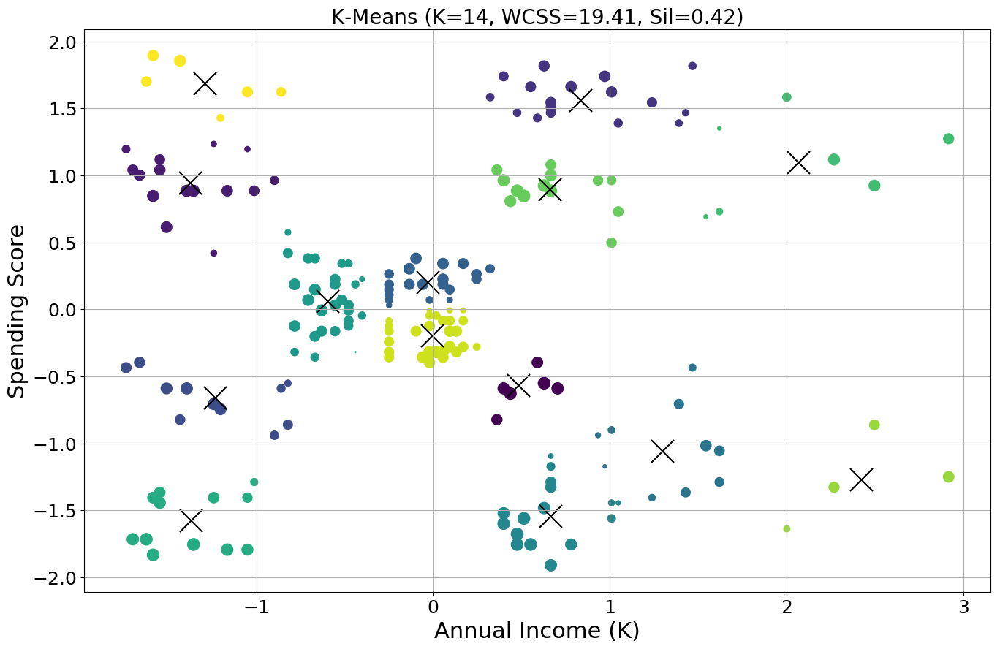

K=14, WCSS=19.41, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


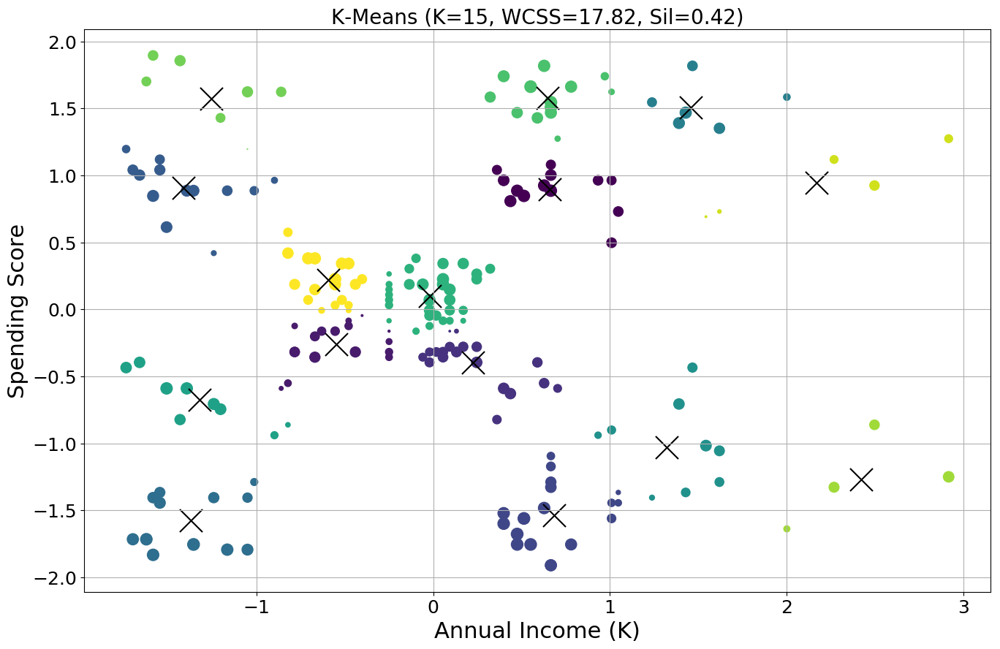

K=15, WCSS=17.82, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


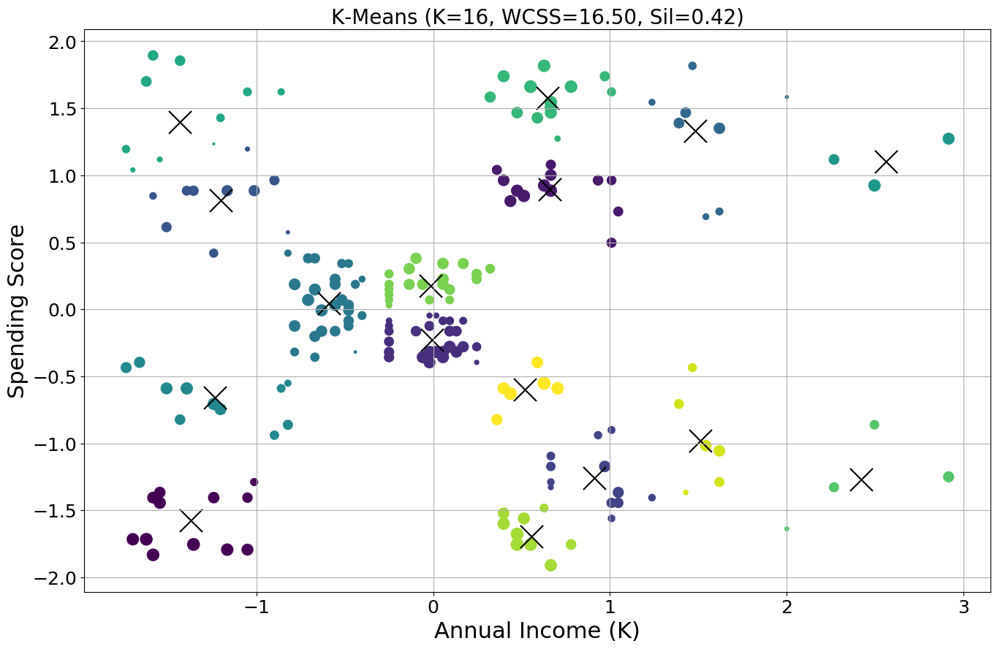

K=16, WCSS=16.50, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


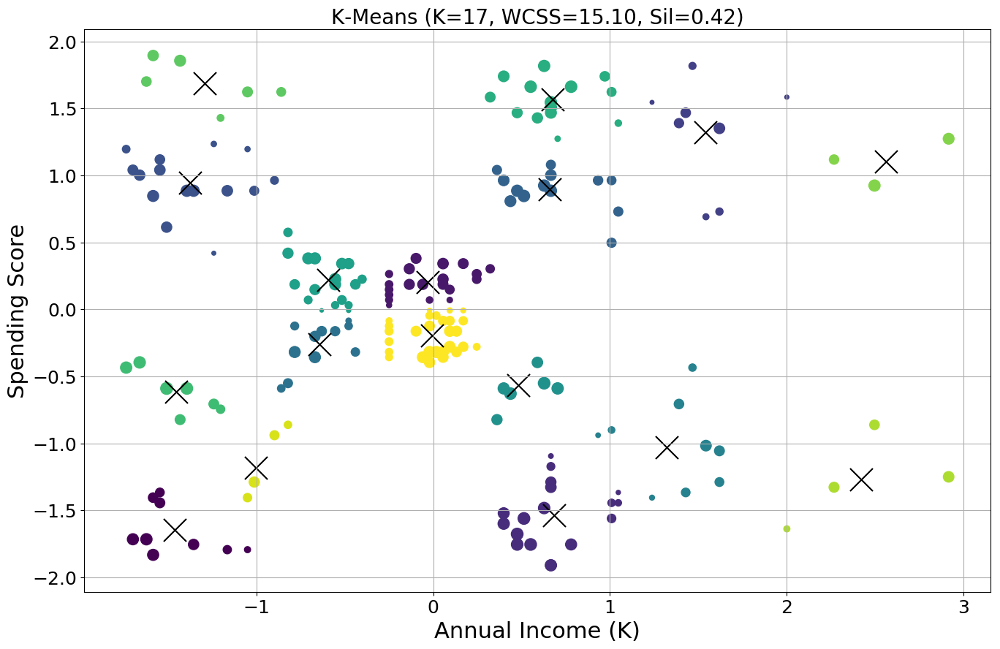

K=17, WCSS=15.10, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


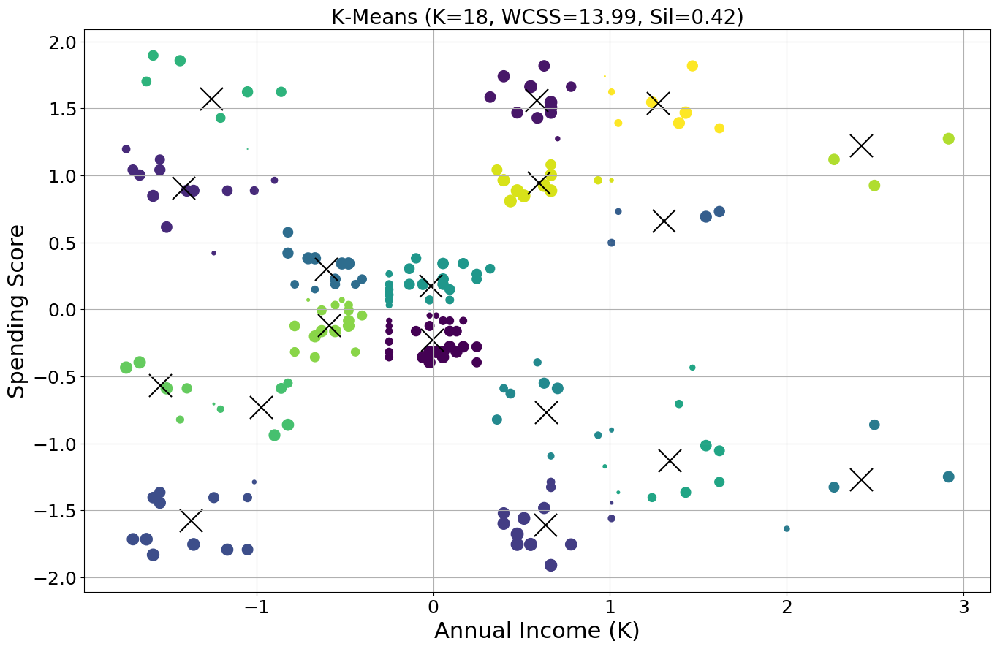

K=18, WCSS=13.99, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


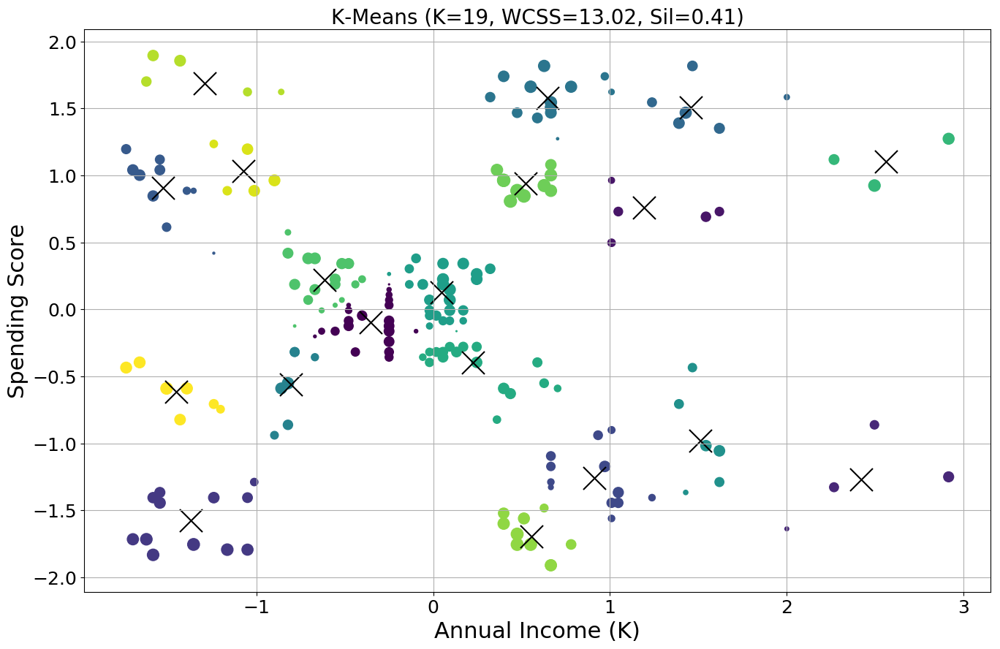

K=19, WCSS=13.02, Sil=0.41


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


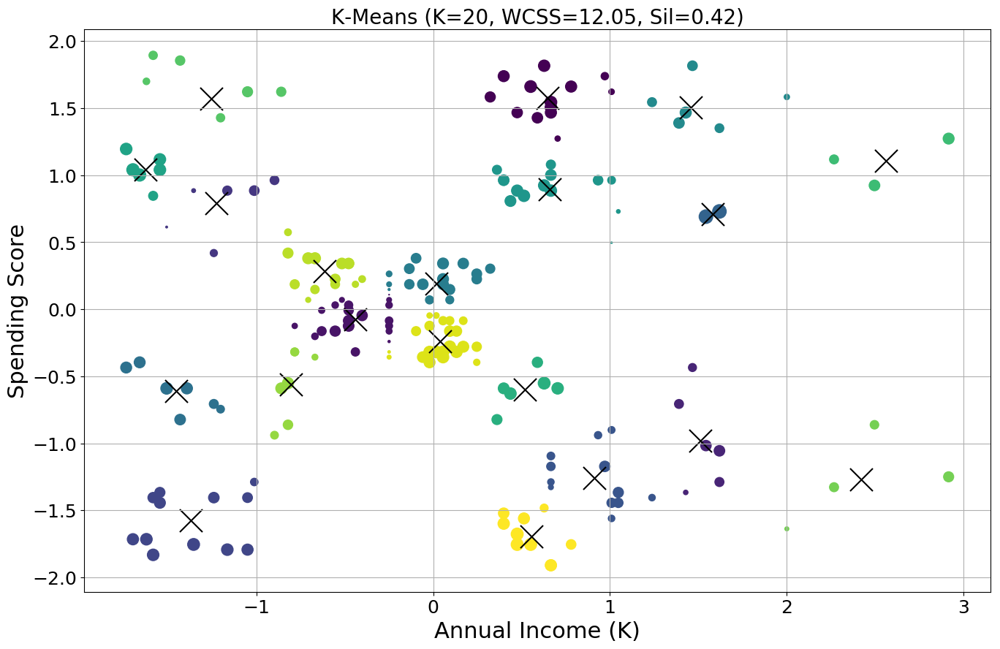

K=20, WCSS=12.05, Sil=0.42


In [22]:
def do_kmeans(X, k):
    k_means = KMeans(init='k-means++', n_clusters=k, n_init=10, random_state=42)
    k_means.fit(X)
    wcss = k_means.inertia_
    sil = silhouette_score(X, k_means.labels_)
    
    plt.style.use('default');

    sample_silhouette_values = silhouette_samples(X, k_means.labels_)
    sizes = 200*sample_silhouette_values

    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
    plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

    plt.title("K-Means (K={}, WCSS={:.2f}, Sil={:.2f})".format(k, wcss, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.show()
    
    print("K={}, WCSS={:.2f}, Sil={:.2f}".format(k, wcss, sil))

for k in range(2, 21):
    do_kmeans(X, k)

# Look at Individual Silhouette Scores

In [23]:
k_means = KMeans(init='k-means++', n_clusters=7, n_init=10, random_state=42)
k_means.fit(X)
sample_silhouette_values = silhouette_samples(X, k_means.labels_)

X_tmp = X.copy()
X_tmp['Cluster ID'] = k_means.labels_

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [24]:
X_tmp['Silhouette'] = sample_silhouette_values
X_tmp = X_tmp.sort_values(['Silhouette'])
X_tmp.head()
X_tmp.tail()

,AnnualIncome,SpendingScore,Cluster ID,Silhouette
179,1.238216,1.545098,1,-0.070888
42,-0.822933,-0.551266,3,-0.022478
142,0.589336,-0.395980,0,0.016976
45,-0.822933,0.574559,4,0.027658
126,0.398489,-0.590088,2,0.028098


,AnnualIncome,SpendingScore,Cluster ID,Silhouette
76,-0.250391,0.108700,0,0.733918
74,-0.250391,-0.124229,0,0.739517
78,-0.250391,0.069879,0,0.744169
77,-0.250391,-0.085407,0,0.748793
80,-0.250391,0.031057,0,0.751882


<Figure size 1600x1000 with 0 Axes>

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


Text(0.5, 1.0, 'K-Means (K = 7, Sil=0.45)')

Text(0.5, 0, 'Annual Income (K)')

Text(0, 0.5, 'Spending Score')

(array([-2., -1.,  0.,  1.,  2.,  3.,  4.]),
 <a list of 7 Text xticklabel objects>)

(array([-2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5]),
 <a list of 11 Text yticklabel objects>)

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-1.3075186893850437, -1.1369653606646668, '3')

Text(-1.329545316496027, 1.132177879659924, '4')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(-0.21657044217664875, -0.01169560942954998, '0')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(0.6670380386547017, 1.2303661776933101, '5')

Text(0.7038442739274822, -1.3046920070238262, '2')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.8756457495008931, -1.0947680120651766, '6')

Text(1.81769761612193, 1.262759492962347, '1')

Text(1.238216282332295, 1.5450981163189368, '179')

Text(-0.8229328929434121, -0.5512661621037414, '42')

Text(0.5893359864121651, -0.3959799192576171, '142')

Text(-0.8229328929434121, 0.5745590985306598, '45')

Text(0.3984888405533033, -0.5900877228152724, '126')

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


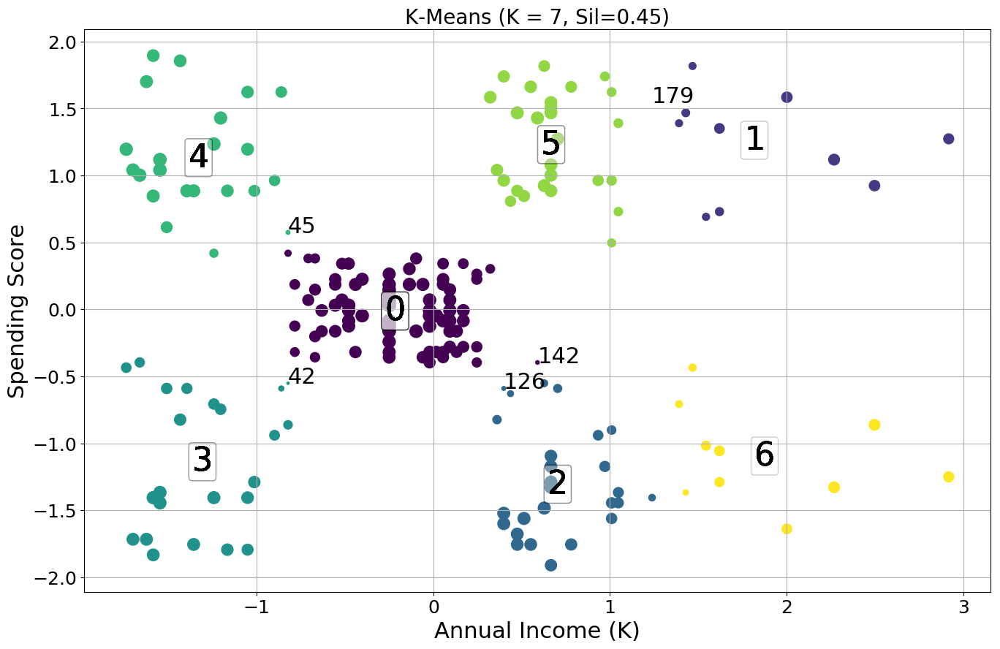

In [25]:
plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X_tmp['AnnualIncome'], X_tmp['SpendingScore'], sizes=200*(X_tmp['Silhouette']+0.05), c=X_tmp['Cluster ID'])

plt.title("K-Means (K = {}, Sil={:.2f})".format(k_means.n_clusters, silhouette_score(X, kmeans.labels_, metric='euclidean')), fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));
    
for i, txt in enumerate(X_tmp.index.values):
    sil = X_tmp['Silhouette'].iloc[i]
    if sil < 0.05:
        plt.text(x=X_tmp['AnnualIncome'].iloc[i], y=X_tmp['SpendingScore'].iloc[i], s=txt, fontsize=22)

# DBSCAN

In [26]:
db = DBSCAN(eps=0.3, min_samples=2)
db.fit(X)

DBSCAN(algorithm='auto', eps=0.3, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=2, n_jobs=None, p=None)

In [27]:
db.labels_

array([ 0,  1,  2,  1,  0,  1,  2,  3,  2,  1,  2,  3,  2,  1,  2,  1,  0,
        1,  0,  3,  0,  1,  2,  1,  4,  1,  0, -1,  0,  1,  2,  1,  2,  1,
        4,  1,  4,  1,  5,  1,  5,  1,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  6,  5,  6,  5,  6,  7,  6,  7,  6,  5,  6,  7,  6,
        7,  6,  7,  6,  7,  6,  5,  6,  7,  6,  5,  6,  7,  6,  7,  6,  7,
        6,  7,  6,  7,  6,  7,  6,  5,  6,  7,  6,  8,  6,  8,  6,  8,  6,
        8,  6,  8,  6,  8,  6,  8,  6,  8,  6,  9,  6,  8,  6,  9, -1,  8,
       10,  8,  6,  8, 10, -1, -1, -1, -1, -1, -1, -1, -1], dtype=int64)

In [28]:
silhouette_score(X, db.labels_)

0.3745966900645067

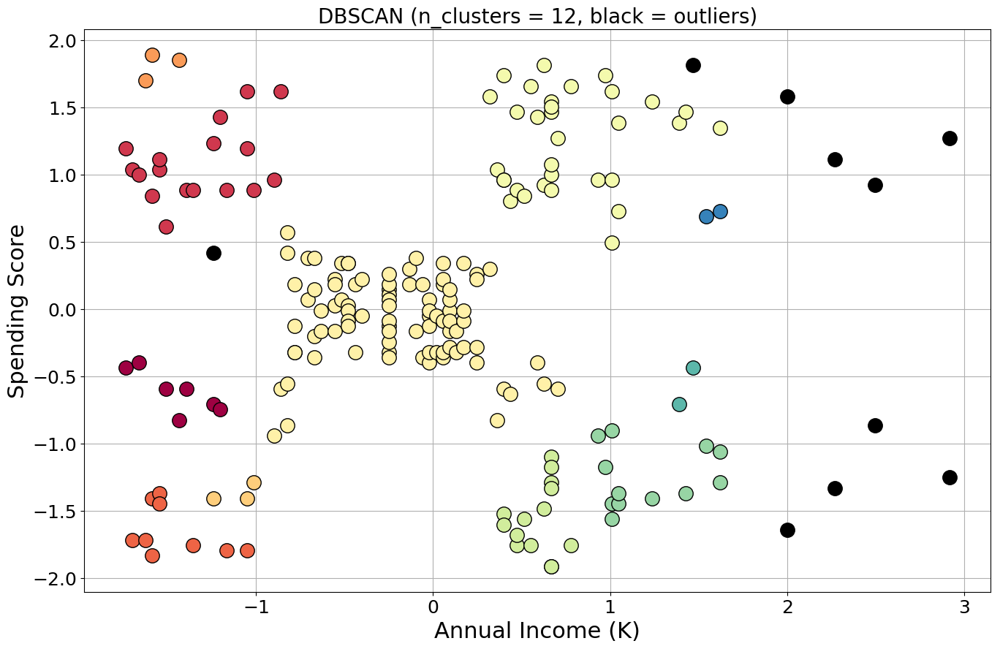

In [29]:
plt.figure(figsize=(16, 10));
plt.grid(True);

unique_labels = set(db.labels_)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

for k in unique_labels:
    if k == -1:        # Black used for noise.
        col = [0, 0, 0, 1]
    else:
        col = colors[k]

    xy = X[db.labels_ == k]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);

    
plt.title('');
plt.title("DBSCAN (n_clusters = {:d}, black = outliers)".format(len(unique_labels)), fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

## Elbow Method

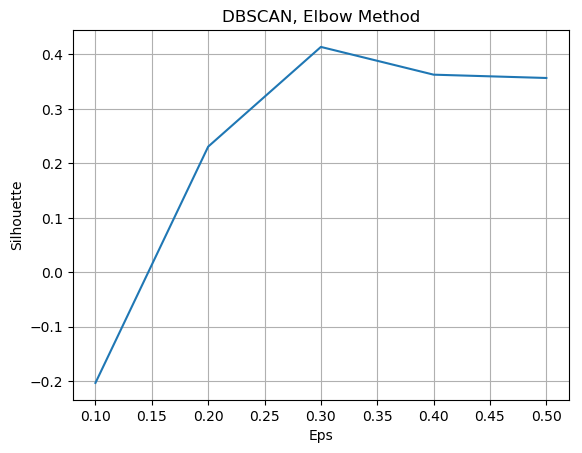

In [30]:
silhouettes = {}
for eps in np.arange(0.1, 0.6, 0.1):
    db = DBSCAN(eps=eps, min_samples=3).fit(X)
    silhouettes[eps] = silhouette_score(X, db.labels_, metric='euclidean')
    

plt.figure();
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('DBSCAN, Elbow Method')
plt.xlabel("Eps");
plt.ylabel("Silhouette");
plt.grid(True);

## Parameter Exploration

eps=0.1, min_samples=1, n_clusters=110, sil=0.30034080305381233
eps=0.1, min_samples=2, n_clusters=40, sil=0.0660876788435225
eps=0.1, min_samples=3, n_clusters=15, sil=-0.20308391205535767
eps=0.1, min_samples=4, n_clusters=8, sil=-0.27565539274724876
eps=0.1, min_samples=5, n_clusters=5, sil=-0.2700934604293137
eps=0.1, min_samples=6, n_clusters=4, sil=-0.301443775619125
eps=0.1, min_samples=7, n_clusters=3, sil=-0.28431740706316444
eps=0.1, min_samples=8, n_clusters <= 1. Returning.
eps=0.1, min_samples=9, n_clusters <= 1. Returning.
eps=0.2, min_samples=1, n_clusters=46, sil=0.2303172836524675
eps=0.2, min_samples=2, n_clusters=25, sil=0.20606104897946675
eps=0.2, min_samples=3, n_clusters=14, sil=0.23058471130629898
eps=0.2, min_samples=4, n_clusters=6, sil=0.19685111632552818
eps=0.2, min_samples=5, n_clusters=8, sil=0.14057942679617558
eps=0.2, min_samples=6, n_clusters=5, sil=0.09644483815713827
eps=0.2, min_samples=7, n_clusters=5, sil=0.05559332249286136
eps=0.2, min_samples=

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

eps=0.3, min_samples=8, n_clusters=6, sil=0.19432071085905328
eps=0.3, min_samples=9, n_clusters=5, sil=0.1460941923615792
eps=0.4, min_samples=1, n_clusters=12, sil=0.28742025766331464
eps=0.4, min_samples=2, n_clusters=7, sil=0.32219422583342383


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

eps=0.4, min_samples=3, n_clusters=5, sil=0.3626911889159071
eps=0.4, min_samples=4, n_clusters=4, sil=0.39828449401818633
eps=0.4, min_samples=5, n_clusters=5, sil=0.41325830390002166
eps=0.4, min_samples=6, n_clusters=5, sil=0.4042821432758869
eps=0.4, min_samples=7, n_clusters=5, sil=0.4043035202447902
eps=0.4, min_samples=8, n_clusters=6, sil=0.4148124800517594

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are


eps=0.4, min_samples=9, n_clusters=5, sil=0.3448055213289852
eps=0.5, min_samples=1, n_clusters=7, sil=0.2681328893586485
eps=0.5, min_samples=2, n_clusters=5, sil=0.26638945791893887
eps=0.5, min_samples=3, n_clusters=3, sil=0.3566017629129311
eps=0.5, min_samples=4, n_clusters=3, sil=0.35044619989666004


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

eps=0.5, min_samples=5, n_clusters=3, sil=0.35044619989666004
eps=0.5, min_samples=6, n_clusters=3, sil=0.3597246686657918
eps=0.5, min_samples=7, n_clusters=3, sil=0.35261506078723714
eps=0.5, min_samples=8, n_clusters=3, sil=0.3471977366353613
eps=0.5, min_samples=9, n_clusters=4, sil=0.31732880330547364
eps=0.6, min_samples=1, n_clusters <= 1. Returning.
eps=0.6, min_samples=2, n_clusters <= 1. Returning.
eps=0.6, min_samples=3, n_clusters <= 1. Returning.
eps=0.6, min_samples=4, n_clusters=2, sil=0.42136463110237615


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

eps=0.6, min_samples=5, n_clusters=2, sil=0.42136463110237615
eps=0.6, min_samples=6, n_clusters=2, sil=0.4184670145377363
eps=0.6, min_samples=7, n_clusters=2, sil=0.4184670145377363
eps=0.6, min_samples=8, n_clusters=2, sil=0.4184670145377363
eps=0.6, min_samples=9, n_clusters=2, sil=0.41462162425790006


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


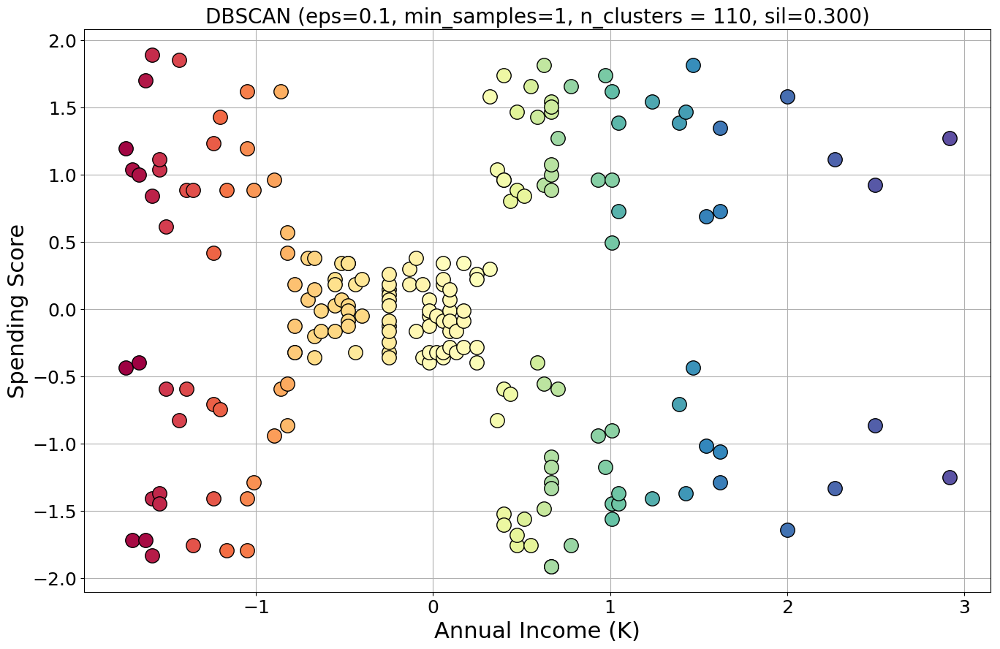

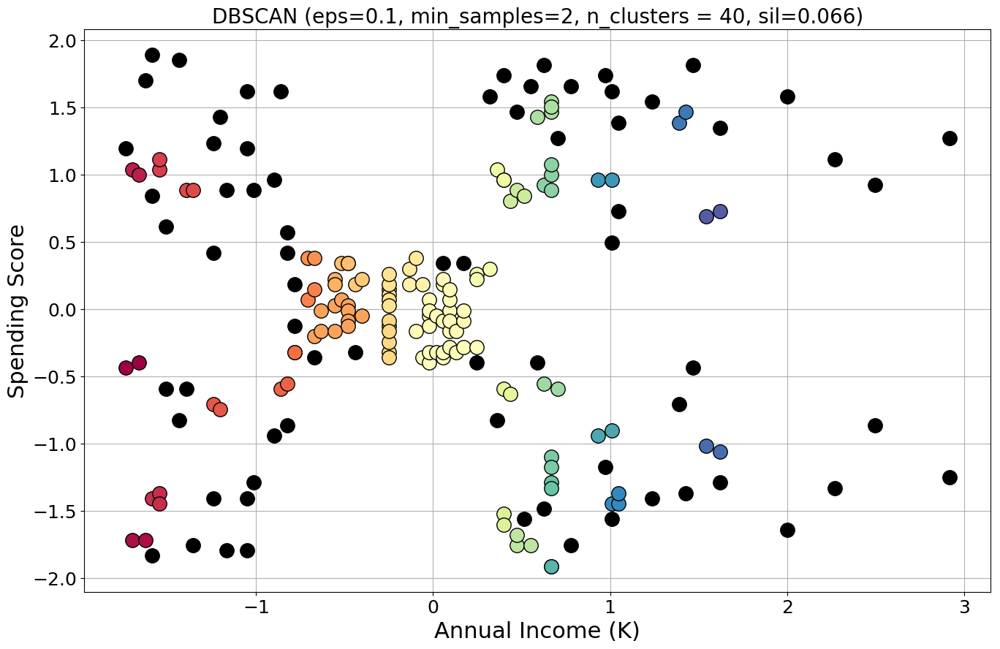

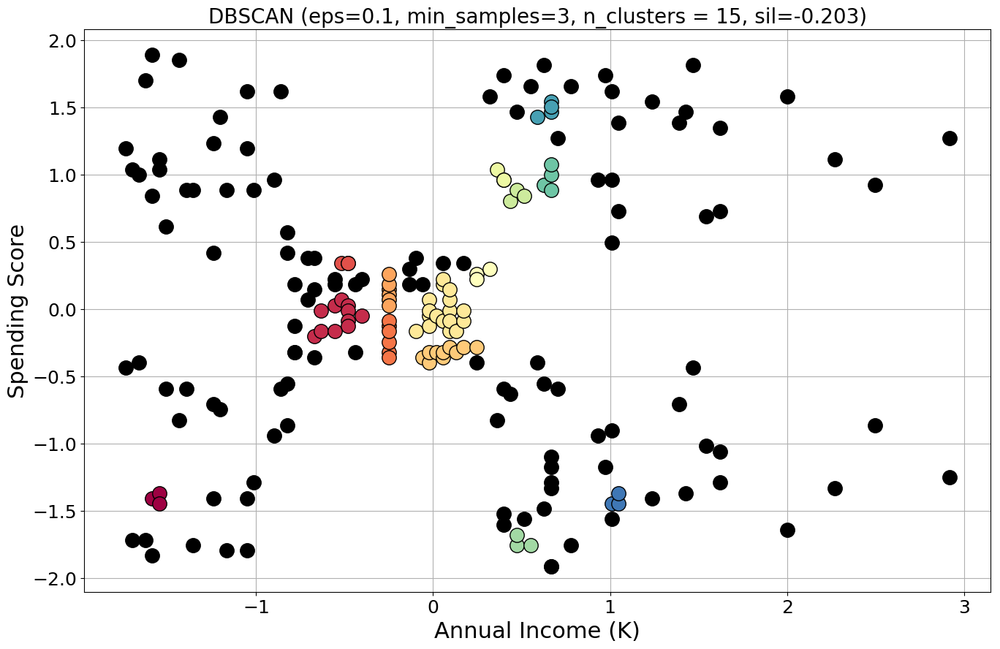

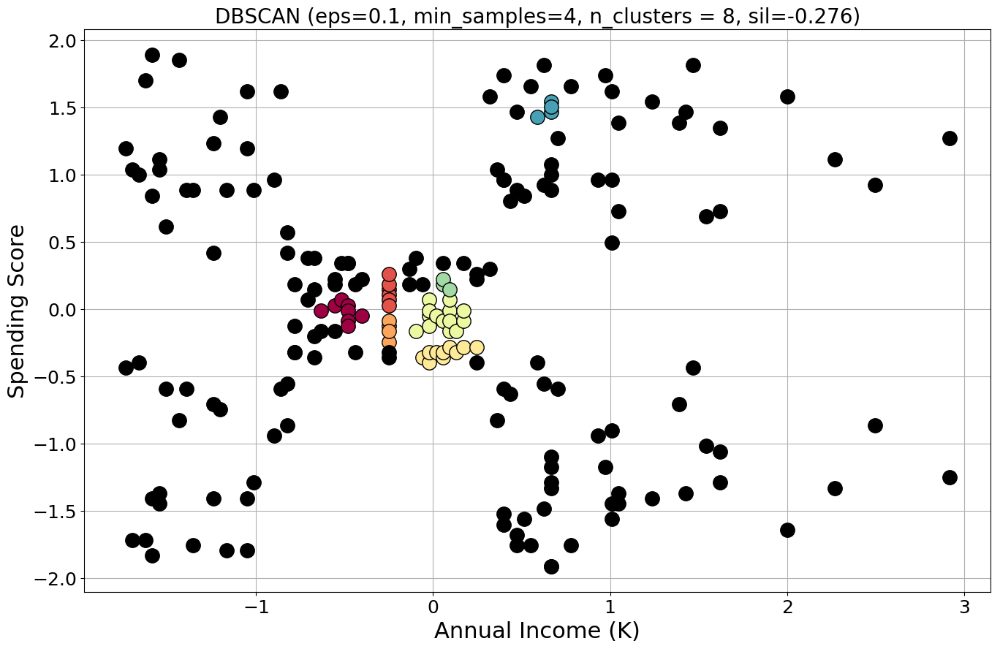

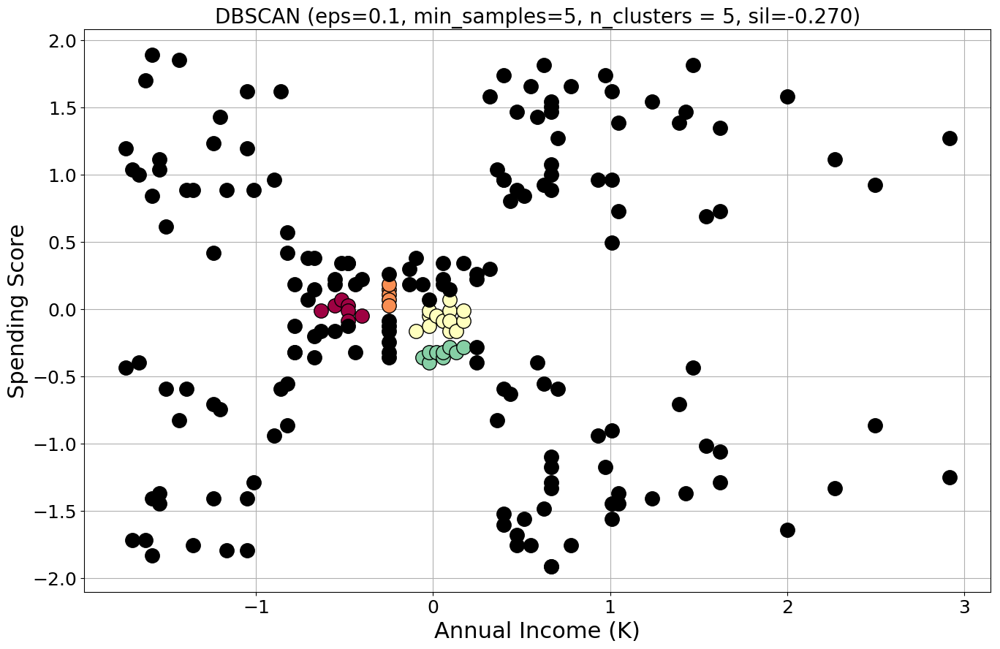

...

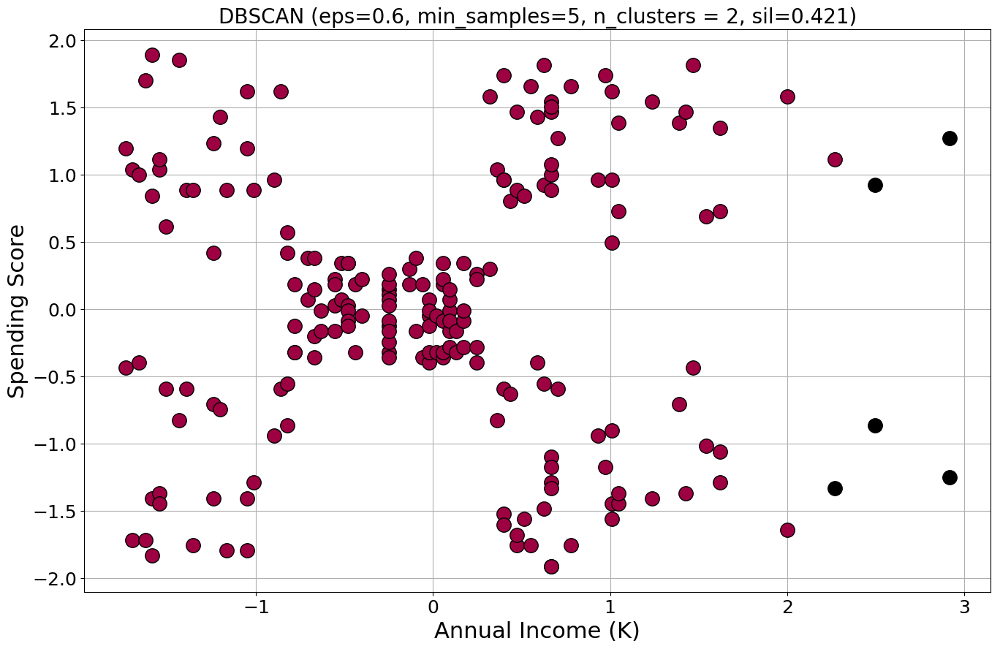

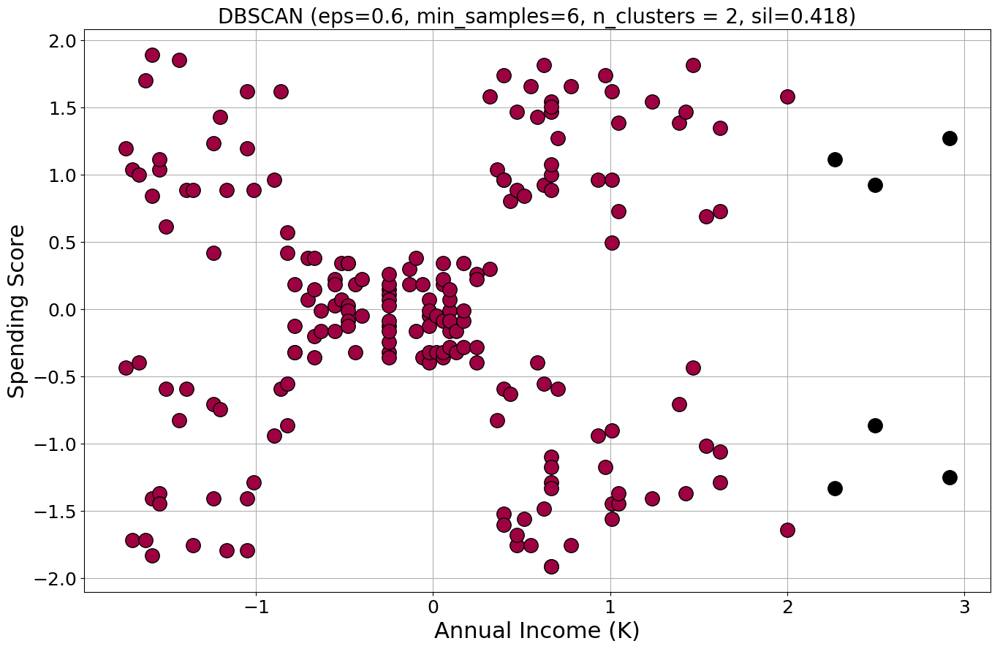

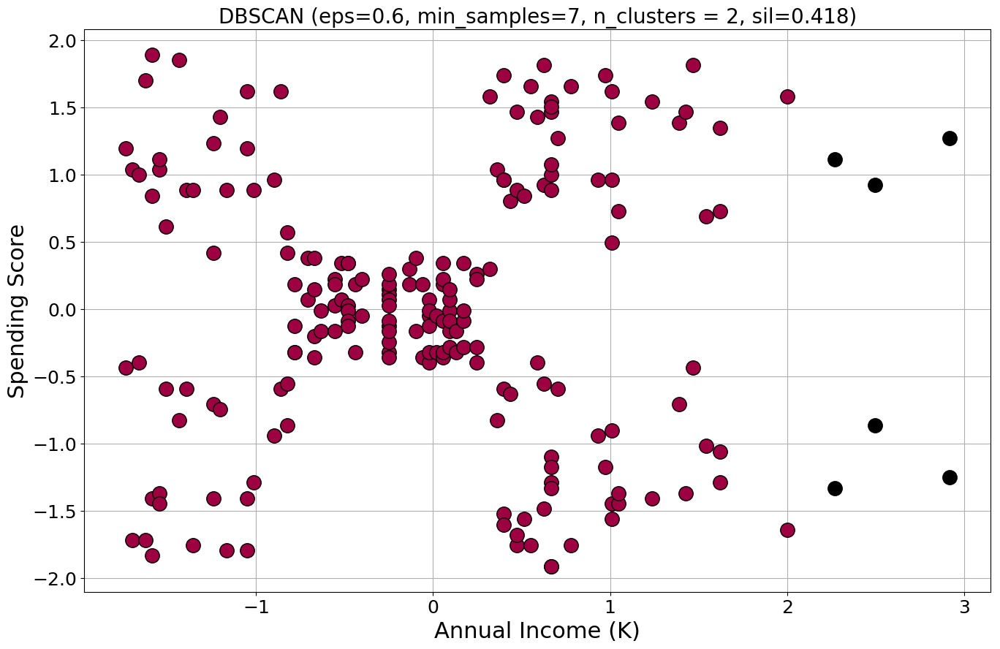

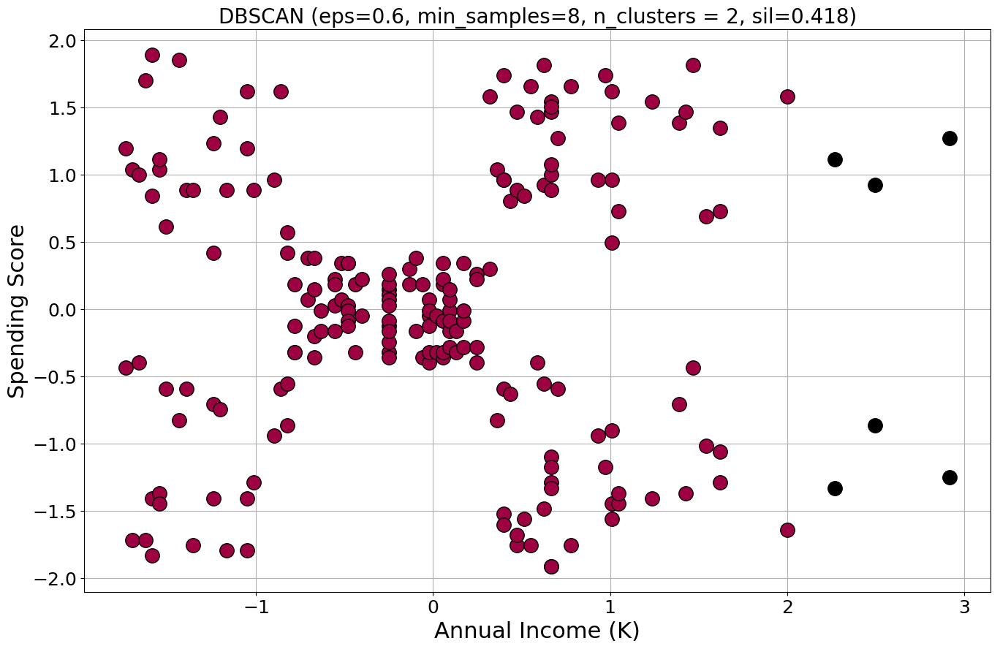

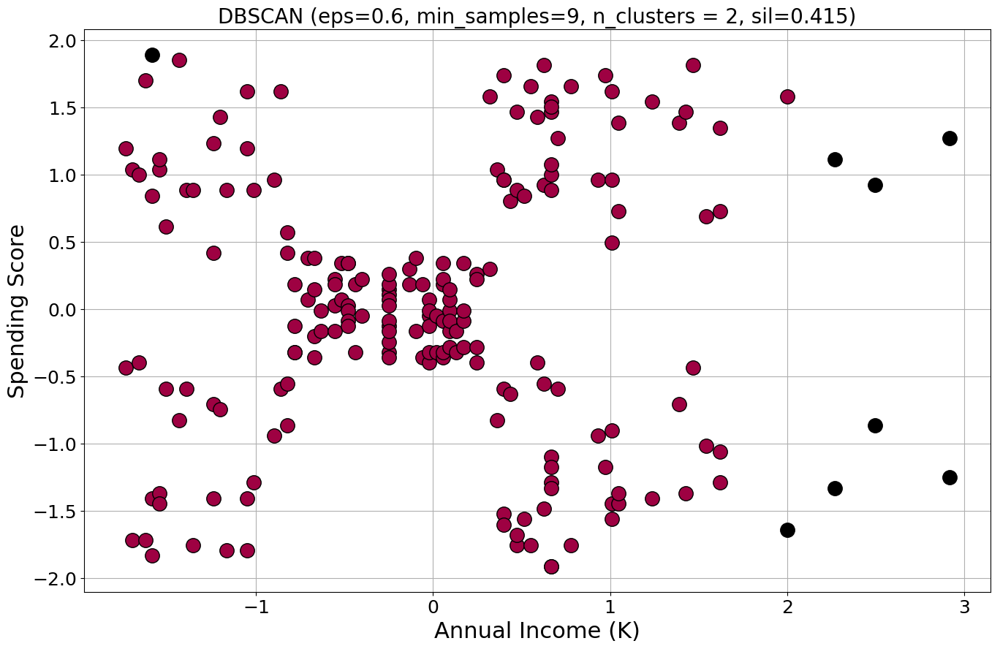

In [31]:
def do_dbscan(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)

    unique_labels = set(db.labels_)
    n_clusters = len(unique_labels)
    
    if n_clusters <= 1:
        print('eps={}, min_samples={}, n_clusters <= 1. Returning.'.format(eps, min_samples))
        return
    
    sil = silhouette_score(X, db.labels_)
    print("eps={}, min_samples={}, n_clusters={}, sil={}".format(eps, min_samples, n_clusters, sil))
    
    plt.figure(figsize=(16, 10));
    plt.grid(True);   
    
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

    for k in unique_labels:
        if k == -1:        # Black used for noise.
            col = [0, 0, 0, 1]
        else:
            col = colors[k]

        xy = X[db.labels_ == k]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);


    plt.title('');
    plt.title("DBSCAN (eps={}, min_samples={}, n_clusters = {:d}, sil={:.3f})".format(eps, min_samples, n_clusters, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    

epss = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
min_samples = range(1, 10)

for prod in list(itertools.product(epss, min_samples)):
    do_dbscan(X, prod[0], prod[1])

# Hierarchical (Agglomerative)

In [32]:
agg = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
agg.fit(X)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=5,
                        pooling_func='deprecated')

In [33]:
agg.labels_

array([4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3,
       4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 2,
       4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 1, 0, 1, 0, 1,
       2, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2, 1, 0, 1, 2, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 2, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1], dtype=int64)

In [34]:
silhouette_score(X, agg.labels_)

0.5538089226688662

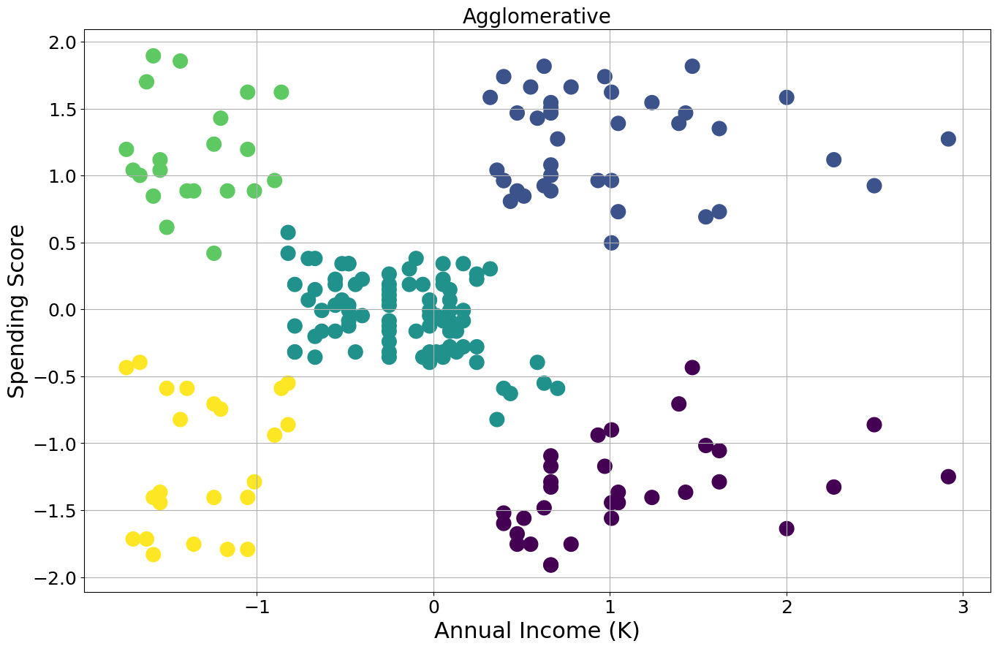

In [35]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=agg.labels_);
plt.title("Agglomerative", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

## Dendograms, Linkages, and Distance Metrics

Note that scikit learn does not itself currently support plotting dendograms. Instead, we'll use SciPy's `cluster.hierarchy` module to re-do the clustering, and plot the dendogram.

## Distance Metrics

Linkage=complete, Metric=euclidean, Clusters=5, Silhouette=0.553
Linkage=complete, Metric=minkowski, Clusters=5, Silhouette=0.553
Linkage=complete, Metric=cityblock, Clusters=5, Silhouette=0.566
Linkage=complete, Metric=cosine, Clusters=5, Silhouette=0.766
Linkage=complete, Metric=correlation, Clusters=3, Silhouette=0.501
Linkage=complete, Metric=chebyshev, Clusters=5, Silhouette=0.456
Linkage=complete, Metric=canberra, Clusters=5, Silhouette=0.258
Linkage=complete, Metric=mahalanobis, Clusters=5, Silhouette=0.553
Linkage=ward, Metric=euclidean, Clusters=5, Silhouette=0.554
Linkage=single, Metric=euclidean, Clusters=5, Silhouette=0.276
Linkage=single, Metric=minkowski, Clusters=5, Silhouette=0.276


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=single, Metric=cityblock, Clusters=5, Silhouette=0.222
Linkage=single, Metric=cosine, Clusters=5, Silhouette=0.573


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=single, Metric=correlation, Clusters=2, Silhouette=1.0


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=single, Metric=chebyshev, Clusters=5, Silhouette=0.272
Linkage=single, Metric=canberra, Clusters=5, Silhouette=0.332


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=single, Metric=mahalanobis, Clusters=5, Silhouette=0.265
Linkage=centroid, Metric=euclidean, Clusters=5, Silhouette=0.479


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=average, Metric=euclidean, Clusters=5, Silhouette=0.479
Linkage=average, Metric=minkowski, Clusters=5, Silhouette=0.479
Linkage=average, Metric=cityblock, Clusters=5, Silhouette=0.577


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=average, Metric=cosine, Clusters=5, Silhouette=0.75
Linkage=average, Metric=correlation, Clusters=5, Silhouette=0.365


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=average, Metric=chebyshev, Clusters=5, Silhouette=0.48
Linkage=average, Metric=canberra, Clusters=5, Silhouette=0.338


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

Linkage=average, Metric=mahalanobis, Clusters=5, Silhouette=0.481


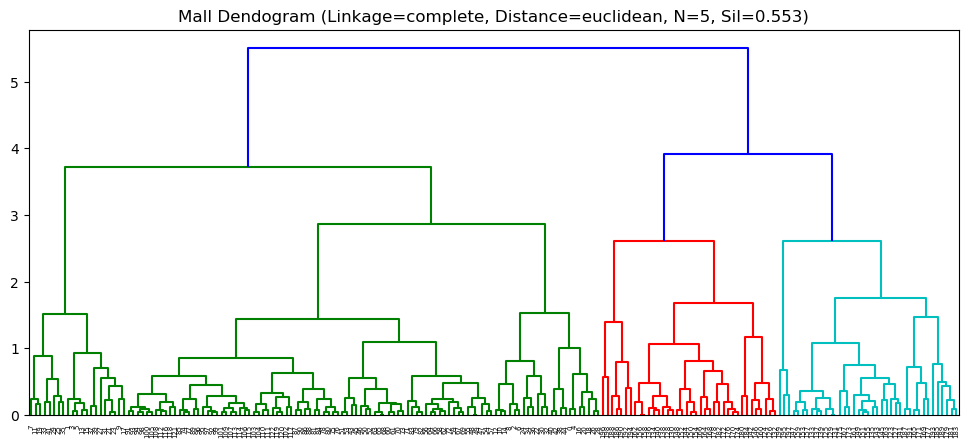

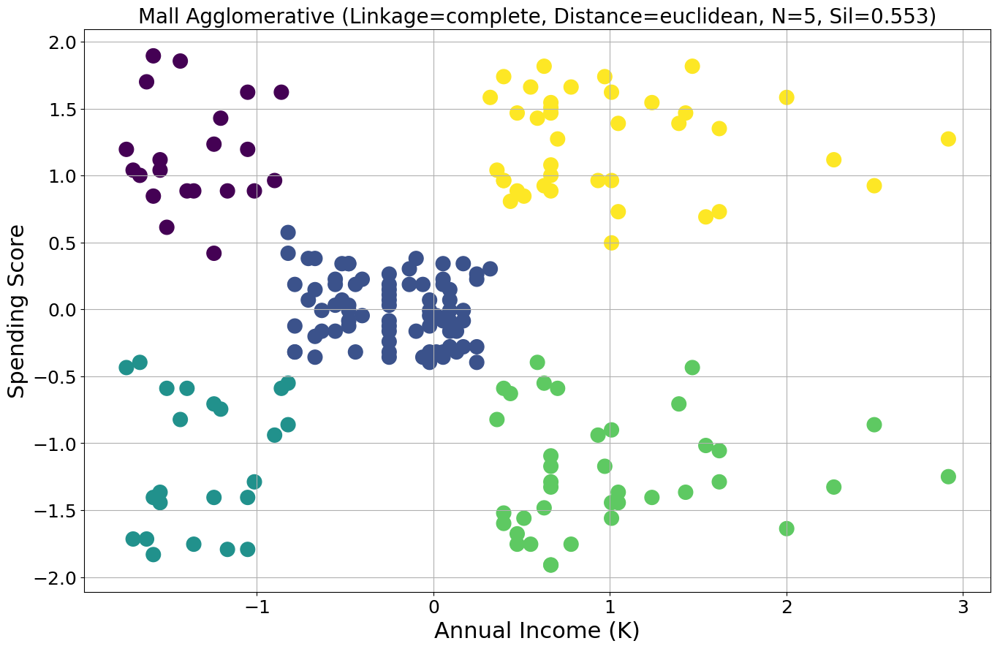

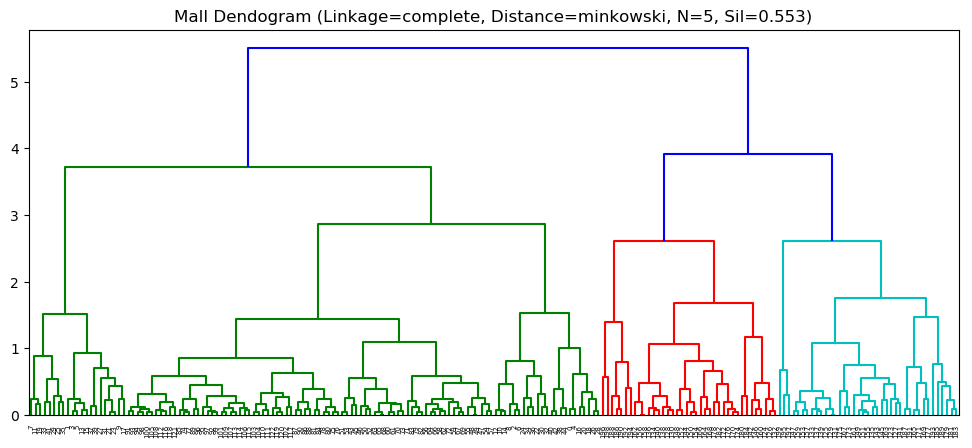

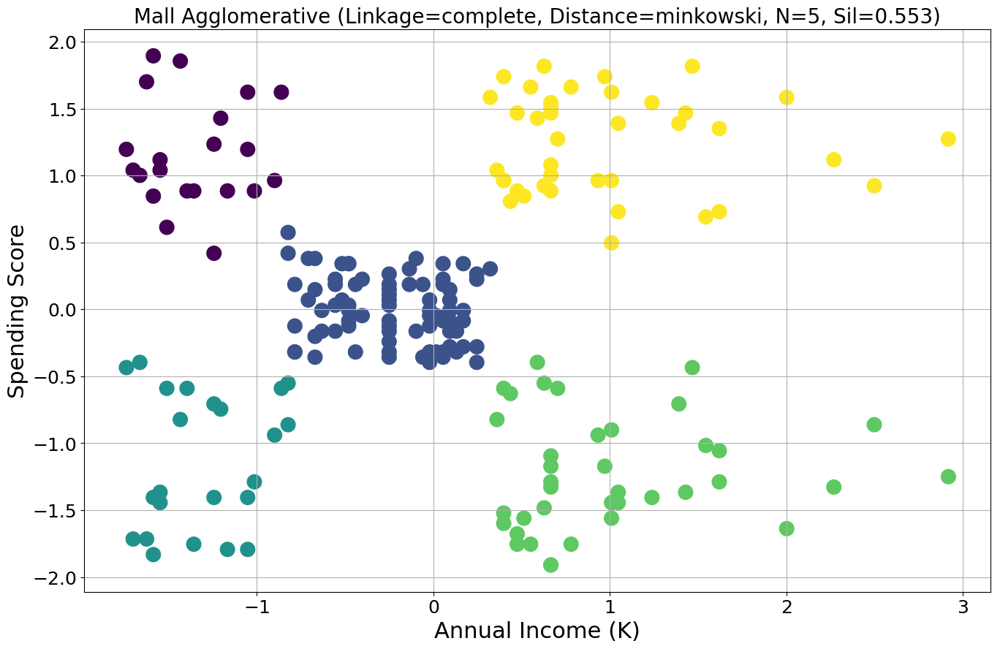

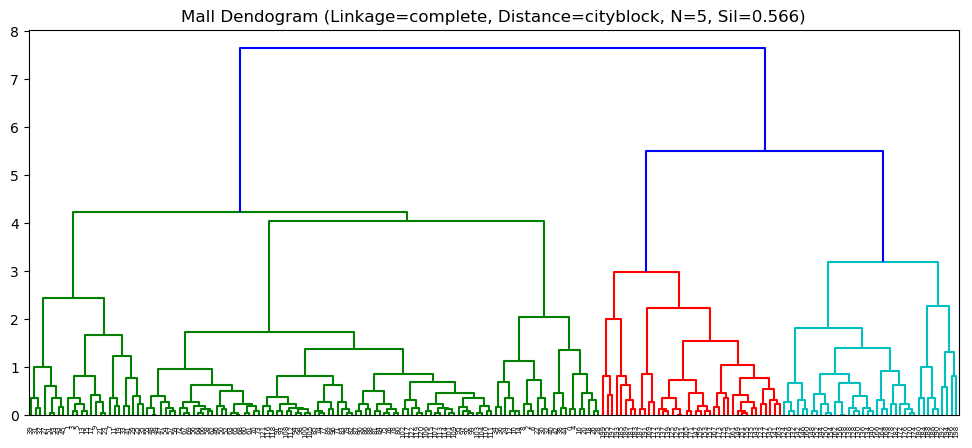

...

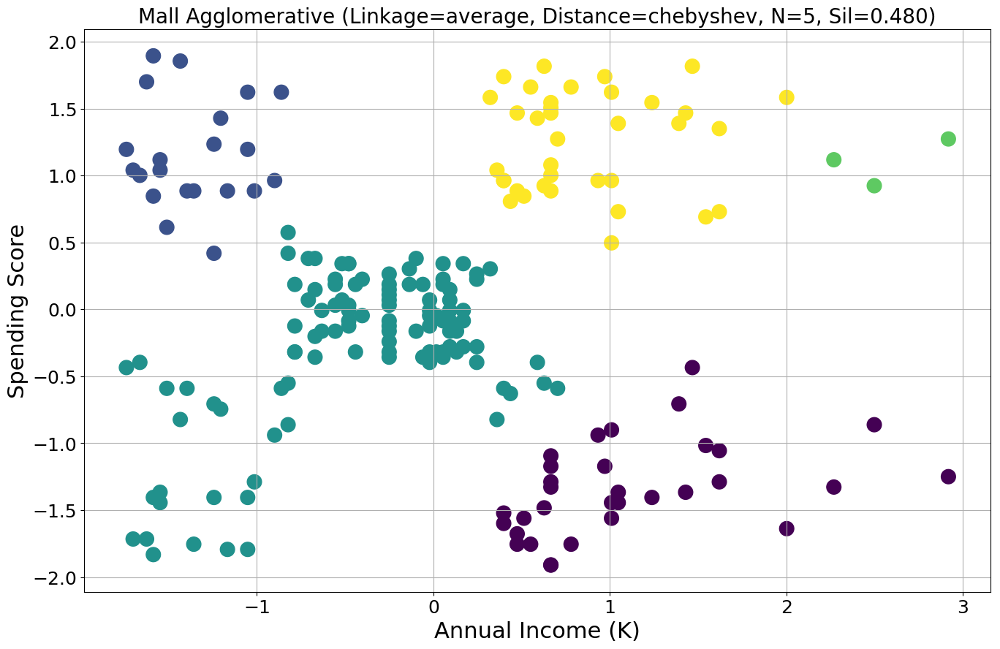

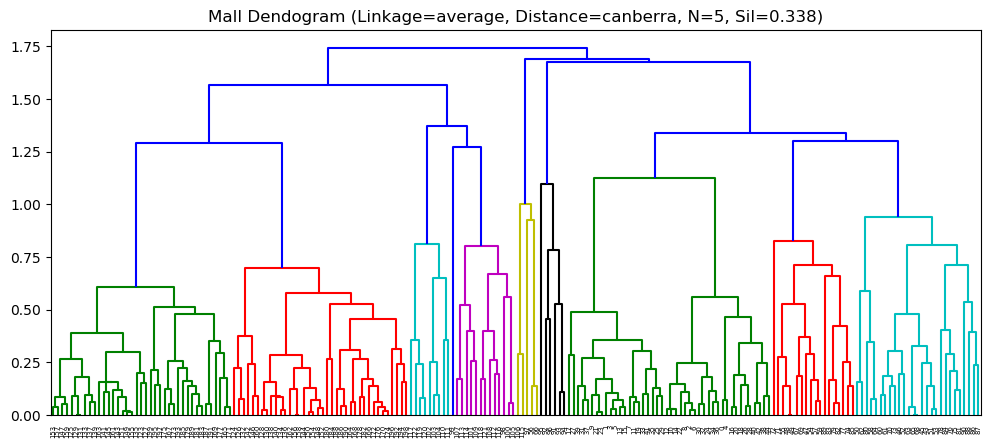

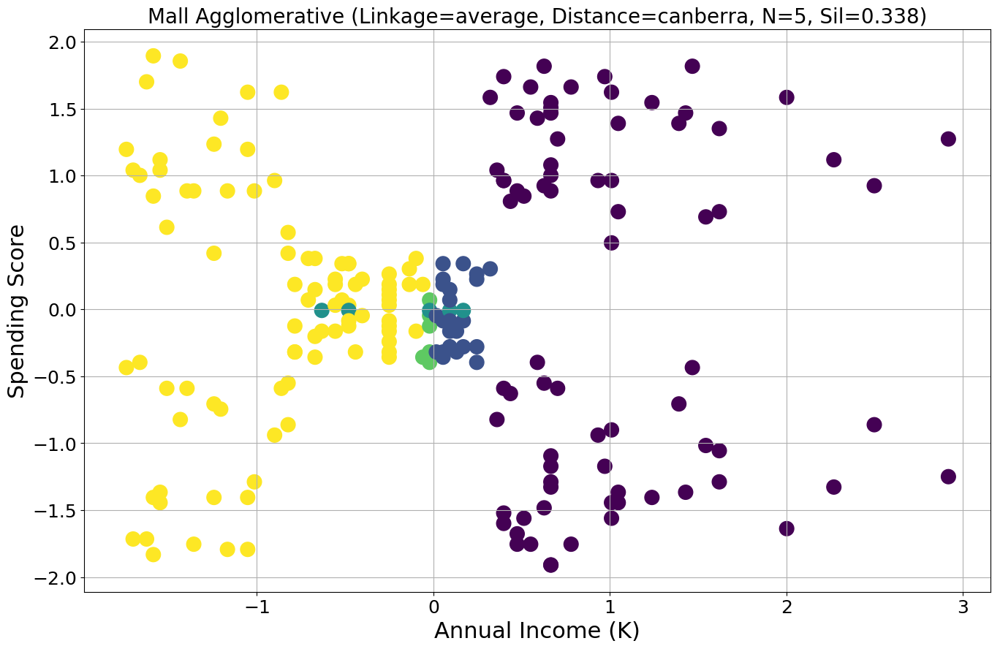

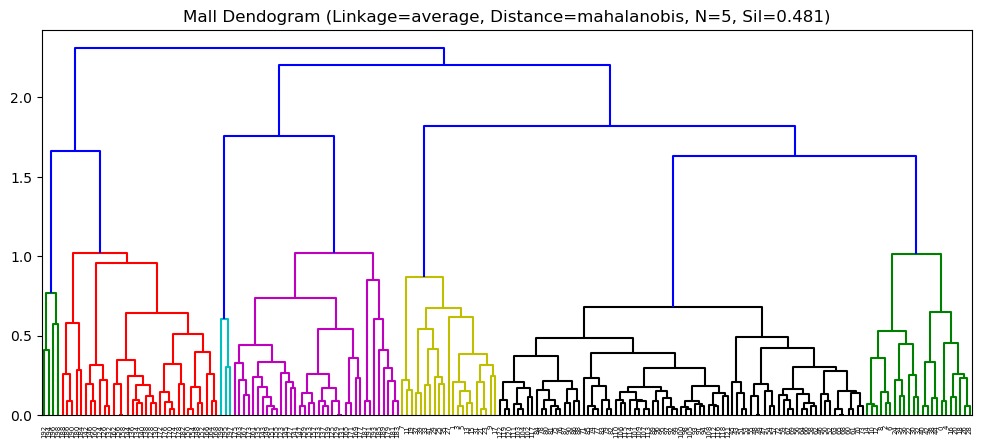

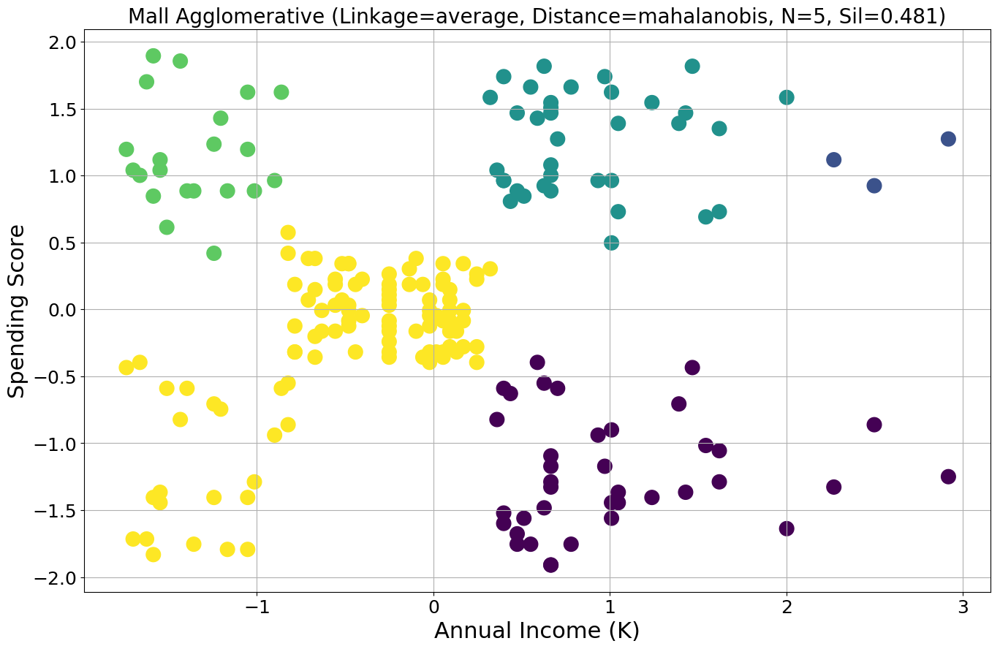

In [36]:
def plot_agg(X, linkage, metric):
    aggl = scipy.cluster.hierarchy.linkage(X, method=linkage, metric=metric)
    
    labels = scipy.cluster.hierarchy.fcluster(aggl, 5, criterion="maxclust")
    
    sil = 0
    n = len(set(labels))
    if n > 1:
        sil = silhouette_score(X , labels, metric=metric)
    print("Linkage={}, Metric={}, Clusters={}, Silhouette={:.3}".format(linkage, metric, n, sil))
    
    # Plot the dendogram
    plt.figure(figsize=(12, 5))  
    plt.title("Mall Dendogram (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil))  
    dend = scipy.cluster.hierarchy.dendrogram(aggl) 
    
    
    # Plot the points
    plt.style.use('default');
    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=labels);
    plt.title("Mall Agglomerative (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);

    
linkages = ['complete', 'ward', 'single', 'centroid', 'average']
metrics = ['euclidean', 'minkowski', 'cityblock', 'cosine', 'correlation', 'chebyshev', 'canberra', 'mahalanobis']

for prod in list(itertools.product(linkages, metrics)):
    
    # Some combos are not allowed
    if (prod[0] in ['ward', 'centroid']) and prod[1] != 'euclidean':
        continue
        
    plot_agg(X, prod[0], prod[1])

# Gaussian Mixture Models (GMM)

In [37]:
gmm = GaussianMixture(n_components=5, covariance_type='full').fit(X)

labels = gmm.predict(X)
silhouette_score(X, labels)

0.5536892843811245

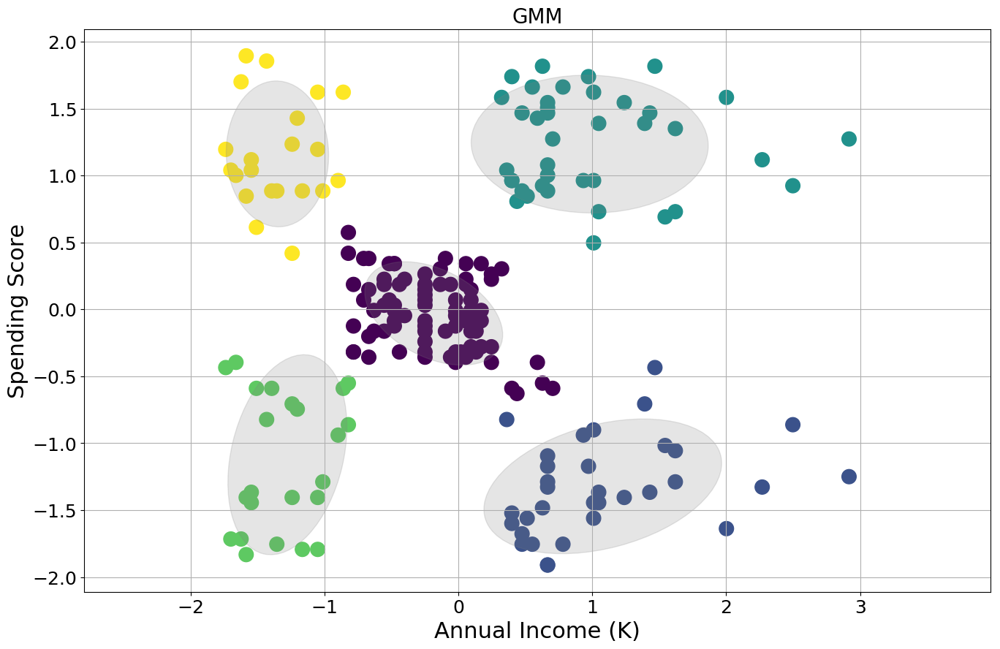

In [38]:
# From:
# https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_covariances.html
def make_ellipses(gmm, ax):
    for n, label in enumerate(set(labels)):
        if gmm.covariance_type == 'full':
            covariances = gmm.covariances_[n][:2, :2]
        elif gmm.covariance_type == 'tied':
            covariances = gmm.covariances_[:2, :2]
        elif gmm.covariance_type == 'diag':
            covariances = np.diag(gmm.covariances_[n][:2])
        elif gmm.covariance_type == 'spherical':
            covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        ell = mpl.patches.Ellipse(gmm.means_[n, :2], v[0], v[1],
                                  180 + angle, color='grey')
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.2)
        ax.add_artist(ell)
        ax.set_aspect('equal', 'datalim')


plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=labels);
make_ellipses(gmm, plt.gca())
plt.title("GMM", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

# Categorical Data

How do we deal with categorical data? Standard K-Means and Standard Euclidean distance don't work. 

We have a number of options:

- Create dummy variables
- Run PCA first
- Use a categorical-aware distance metric, like Gower
- Use a categorical-aware algorithm, like k-mediods/k-modes

In [39]:
scaler = StandardScaler()

X1 = df.copy()

# Create bins of Age
X1['AgeBin'] = pd.cut(X1['Age'], [0, 30, 55, 100])
X1 = X1.drop(['CustomerID', 'Age'], axis=1)

features = ['AnnualIncome', 'SpendingScore']
X1[features] = scaler.fit_transform(X1[features])

X1.info()
X1.describe().transpose()
X1.head(n=20)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 4 columns):
Male             200 non-null bool
AnnualIncome     200 non-null float64
SpendingScore    200 non-null float64
AgeBin           200 non-null category
dtypes: bool(1), category(1), float64(2)
memory usage: 5.1+ KB


,count,mean,std,min,25%,50%,75%,max
AnnualIncome,200.0,-2.131628e-16,1.002509,-1.738999,-0.727509,0.035879,0.665675,2.917671
SpendingScore,200.0,-1.465494e-16,1.002509,-1.910021,-0.599793,-0.007764,0.885132,1.894492


,Male,AnnualIncome,SpendingScore,AgeBin
0,True,-1.738999,-0.434801,"(0, 30]"
1,True,-1.738999,1.195704,"(0, 30]"
2,False,-1.700830,-1.715913,"(0, 30]"
3,False,-1.700830,1.040418,"(0, 30]"
4,False,-1.662660,-0.395980,"(30, 55]"
5,False,-1.662660,1.001596,"(0, 30]"
6,False,-1.624491,-1.715913,"(30, 55]"
7,False,-1.624491,1.700384,"(0, 30]"
8,True,-1.586321,-1.832378,"(55, 100]"
9,False,-1.586321,0.846310,"(0, 30]"


# Gower Distance

Unfortunately, and strangely, sci-kit learn doesn't yet have an implementation of the Gower distance metric. And I coldn't find any package that did. However, I did find some random guy's code that implemented the metric, and it seems to work well. Kudos to him!

In [42]:
# From: https://sourceforge.net/projects/gower-distance-4python/

import numpy as np
import pandas as pd
from scipy.spatial import distance 
from sklearn.utils import validation
from sklearn.metrics import pairwise
from scipy.sparse import issparse


def check_pairwise_arrays(X, Y, precomputed=False, dtype=None):
    X, Y, dtype_float = pairwise._return_float_dtype(X, Y)

    warn_on_dtype = dtype is not None
    estimator = 'check_pairwise_arrays'
    if dtype is None:
        dtype = dtype_float

    if Y is X or Y is None:
        X = Y = validation.check_array(X, accept_sparse='csr', dtype=dtype,
                            warn_on_dtype=warn_on_dtype, estimator=estimator)
    else:
        X = validation.check_array(X, accept_sparse='csr', dtype=dtype,
                        warn_on_dtype=warn_on_dtype, estimator=estimator)
        Y = validation.check_array(Y, accept_sparse='csr', dtype=dtype,
                        warn_on_dtype=warn_on_dtype, estimator=estimator)

    if precomputed:
        if X.shape[1] != Y.shape[0]:
            raise ValueError("Precomputed metric requires shape "
                             "(n_queries, n_indexed). Got (%d, %d) "
                             "for %d indexed." %
                             (X.shape[0], X.shape[1], Y.shape[0]))
    elif X.shape[1] != Y.shape[1]:
        raise ValueError("Incompatible dimension for X and Y matrices: "
                         "X.shape[1] == %d while Y.shape[1] == %d" % (
                             X.shape[1], Y.shape[1]))

    return X, Y


# Vectorized Version
def gower_distances(X, Y=None, feature_weight=None, categorical_features=None):
    """Computes the gower distances between X and Y

    Gower is a similarity measure for categorical, boolean and numerical mixed
    data.

    
    Parameters
    ----------
    X : array-like, or pandas.DataFrame, shape (n_samples, n_features)

    Y : array-like, or pandas.DataFrame, shape (n_samples, n_features)

    feature_weight :  array-like, shape (n_features)
        According the Gower formula, feature_weight is an attribute weight.

    categorical_features: array-like, shape (n_features)
        Indicates with True/False whether a column is a categorical attribute.
        This is useful when categorical atributes are represented as integer
        values. Categorical ordinal attributes are treated as numeric, and must
        be marked as false.
        
        Alternatively, the categorical_features array can be represented only
        with the numerical indexes of the categorical attribtes.

    Returns
    -------
    similarities : ndarray, shape (n_samples, n_samples)

    Notes
    ------
    The non-numeric features, and numeric feature ranges are determined from X and not Y.
    No support for sparse matrices.

    """
    
    if issparse(X) or issparse(Y):
        raise TypeError("Sparse matrices are not supported for gower distance")
        
    y_none = Y is None
    
    
    # It is necessary to convert to ndarray in advance to define the dtype
    if not isinstance(X, np.ndarray):
        X = np.asarray(X)

    array_type = np.object
    # this is necessary as strangelly the validator is rejecting numeric
    # arrays with NaN
    if  np.issubdtype(X.dtype, np.number) and (np.isfinite(X.sum()) or np.isfinite(X).all()):
        array_type = type(np.zeros(1,X.dtype).flat[0])
    
    X, Y = check_pairwise_arrays(X, Y, precomputed=False, dtype=array_type)
    
    n_rows, n_cols = X.shape
    
    if categorical_features is None:
        categorical_features = np.zeros(n_cols, dtype=bool)
        for col in range(n_cols):
            # In numerical columns, None is converted to NaN,
            # and the type of NaN is recognized as a number subtype
            if not np.issubdtype(type(X[0, col]), np.number):
                categorical_features[col]=True
    else:          
        categorical_features = np.array(categorical_features)
    
    
    #if categorical_features.dtype == np.int32:
    if np.issubdtype(categorical_features.dtype, np.int):
        new_categorical_features = np.zeros(n_cols, dtype=bool)
        new_categorical_features[categorical_features] = True
        categorical_features = new_categorical_features
    
    print(categorical_features)
  
    # Categorical columns
    X_cat =  X[:,categorical_features]
    
    # Numerical columns
    X_num = X[:,np.logical_not(categorical_features)]
    ranges_of_numeric = None
    max_of_numeric = None
    
        
    # Calculates the normalized ranges and max values of numeric values
    _ ,num_cols=X_num.shape
    ranges_of_numeric = np.zeros(num_cols)
    max_of_numeric = np.zeros(num_cols)
    for col in range(num_cols):
        col_array = X_num[:, col].astype(np.float32) 
        max = np.nanmax(col_array)
        min = np.nanmin(col_array)
     
        if np.isnan(max):
            max = 0.0
        if np.isnan(min):
            min = 0.0
        max_of_numeric[col] = max
        ranges_of_numeric[col] = (1 - min / max) if (max != 0) else 0.0


    # This is to normalize the numeric values between 0 and 1.
    X_num = np.divide(X_num ,max_of_numeric,out=np.zeros_like(X_num), where=max_of_numeric!=0)

    
    if feature_weight is None:
        feature_weight = np.ones(n_cols)
        
    feature_weight_cat=feature_weight[categorical_features]
    feature_weight_num=feature_weight[np.logical_not(categorical_features)]
    
    
    y_n_rows, _ = Y.shape
    
    dm = np.zeros((n_rows, y_n_rows), dtype=np.float32)
        
    feature_weight_sum = feature_weight.sum()

    Y_cat=None
    Y_num=None
    
    if not y_none:
        Y_cat = Y[:,categorical_features]
        Y_num = Y[:,np.logical_not(categorical_features)]
        # This is to normalize the numeric values between 0 and 1.
        Y_num = np.divide(Y_num ,max_of_numeric,out=np.zeros_like(Y_num), where=max_of_numeric!=0)
    else:
        Y_cat=X_cat
        Y_num = X_num
        
    for i in range(n_rows):
        j_start= i
        
        # for non square results
        if n_rows != y_n_rows:
            j_start = 0

      
        Y_cat[j_start:n_rows,:]
        Y_num[j_start:n_rows,:]
        result= _gower_distance_row(X_cat[i,:], X_num[i,:],Y_cat[j_start:n_rows,:],
                                    Y_num[j_start:n_rows,:],feature_weight_cat,feature_weight_num,
                                    feature_weight_sum,categorical_features,ranges_of_numeric,
                                    max_of_numeric) 
        dm[i,j_start:]=result
        dm[i:,j_start]=result
        

    return dm


def _gower_distance_row(xi_cat,xi_num,xj_cat,xj_num,feature_weight_cat,feature_weight_num,
                        feature_weight_sum,categorical_features,ranges_of_numeric,max_of_numeric ):
    # categorical columns
    sij_cat = np.where(xi_cat == xj_cat,np.zeros_like(xi_cat),np.ones_like(xi_cat))
    sum_cat = np.multiply(feature_weight_cat,sij_cat).sum(axis=1) 

    # numerical columns
    abs_delta=np.absolute( xi_num-xj_num)
    sij_num=np.divide(abs_delta, ranges_of_numeric, out=np.zeros_like(abs_delta), where=ranges_of_numeric!=0)

    sum_num = np.multiply(feature_weight_num,sij_num).sum(axis=1)
    sums= np.add(sum_cat,sum_num)
    sum_sij = np.divide(sums,feature_weight_sum)
    return sum_sij


[ True False False  True]


C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn\utils\validation.py:432: DeprecationWarning: 'warn_on_dtype' is deprecated in version 0.21 and will be removed in 0.23. Don't set `warn_on_dtype` to remove this warning.
  DeprecationWarning)
C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\ipykernel_launcher.py:111: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


<Figure size 1200x500 with 0 Axes>

Text(0.5, 1.0, 'Mall Dendogram (N=6)')

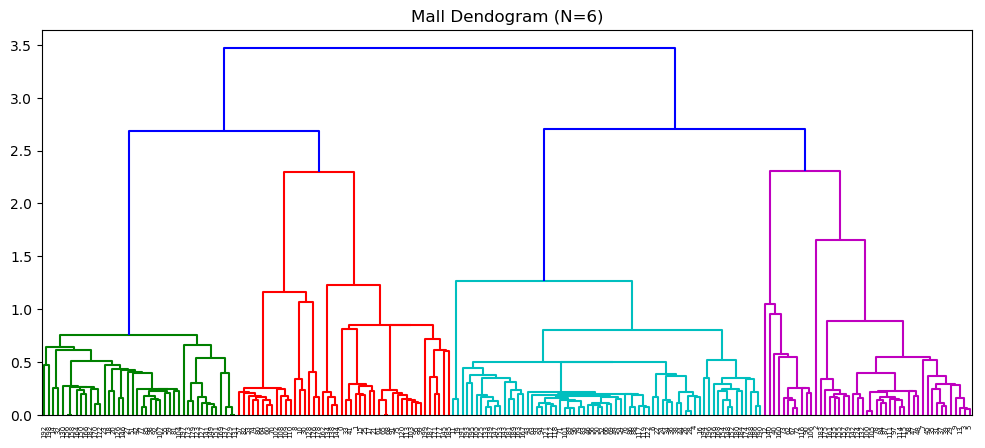

In [43]:
D = gower_distances(X1)
aggl = scipy.cluster.hierarchy.linkage(D)
labels = scipy.cluster.hierarchy.fcluster(aggl, 6, criterion="maxclust")
n = len(set(labels))

# Plot the dendogram
plt.figure(figsize=(12, 5));
plt.title("Mall Dendogram (N={})".format(n)); 
dend = scipy.cluster.hierarchy.dendrogram(aggl) 

# Distance Metrics

,id,dim1,dim2
0,A,1,1
1,B,2,1
2,C,5,5



Points A and B:
Euclidean distance: 1.00
Manhattan distance: 1.00
Chebyshev distance: 1.00
Canberra distance: 0.33
Cosine distance: 0.05

Points A and C:
Euclidean distance: 5.66
Manhattan distance: 8.00
Chebyshev distance: 4.00
Canberra distance: 1.33
Cosine distance: 0.00

Points B and C:
Euclidean distance: 5.00
Manhattan distance: 7.00
Chebyshev distance: 4.00
Canberra distance: 1.10
Cosine distance: 0.05


<Figure size 1000x1000 with 0 Axes>

Text(0.5, 0, 'Feature 1')

Text(0, 0.5, 'Feature 2')

(array([0., 1., 2., 3., 4., 5., 6.]), <a list of 7 Text xticklabel objects>)

(array([0., 1., 2., 3., 4., 5., 6.]), <a list of 7 Text yticklabel objects>)

(0, 6)

(0, 6)

Text(1, 1, 'A')

Text(2, 1, 'B')

Text(5, 5, 'C')

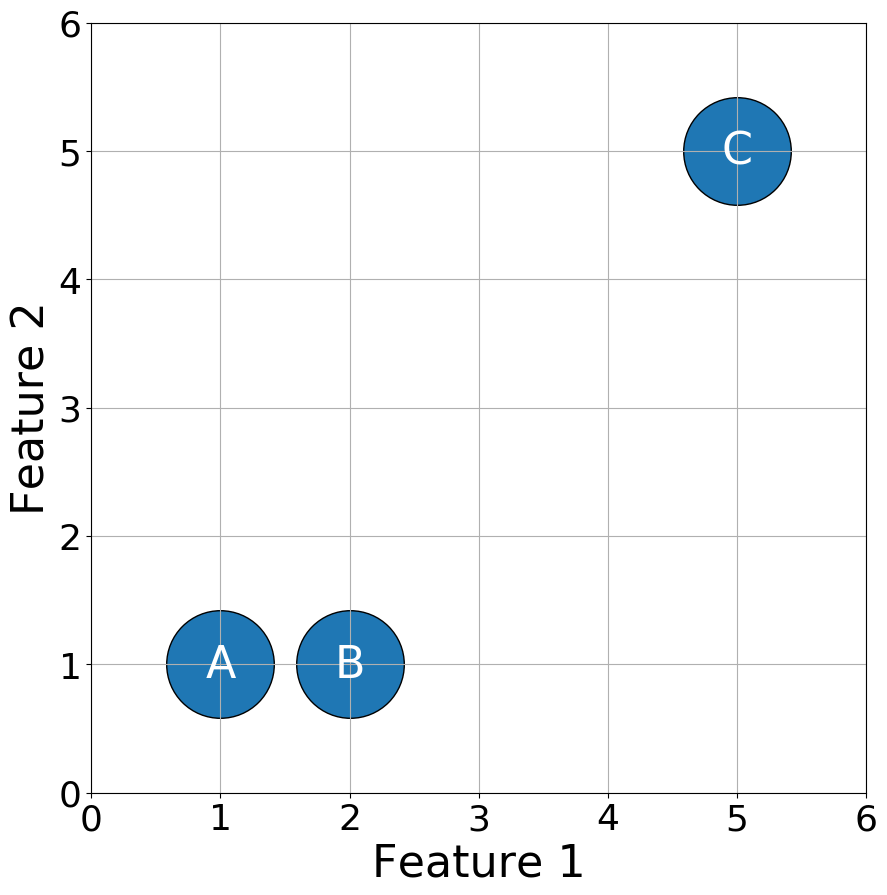

In [44]:
import scipy.spatial.distance as dist
import numpy as np

# Prepare 3 vectors (data points) of 2 dimensions
points = pd.DataFrame(data={'id':['A', 'B', 'C'], 'dim1':[1, 2, 5], 'dim2':[1, 1, 5]})
display(points.head())

for combo in itertools.combinations(points['id'], 2):
    v1 = points[points['id'] == combo[0]][['dim1', 'dim2']]
    v2 = points[points['id'] == combo[1]][['dim1', 'dim2']]
    
    print('\nPoints {} and {}:'.format(combo[0], combo[1]))
    print('Euclidean distance: {:.2f}'.format(dist.euclidean(v1, v2)))
    print('Manhattan distance: {:.2f}'.format(dist.cityblock(v1, v2)))
    print('Chebyshev distance: {:.2f}'.format(dist.chebyshev(v1, v2)))
    print('Canberra distance: {:.2f}'.format(dist.canberra(v1, v2)))
    print('Cosine distance: {:.2f}'.format(dist.cosine(v1, v2)))
    
    
plt.style.use('default');

plt.figure(figsize=(10, 10));
plt.grid(True);

plt.scatter(points['dim1'], points['dim2'], s=6000, marker='o', edgecolors='black');
#plt.title("Distances", fontsize=20);
plt.xlabel('Feature 1', fontsize=32);
plt.ylabel('Feature 2', fontsize=32);
plt.xticks(fontsize=26);
plt.yticks(fontsize=26);
plt.xlim(left=0, right=6);
plt.ylim(bottom=0, top=6);

for i, txt in enumerate(points['id']):
    plt.text(x=points['dim1'].iloc[i], y=points['dim2'].iloc[i], s=txt, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='white');


## Categorical Features

In [45]:
points = pd.DataFrame(data={'id':['A', 'B', 'C'], 'dim1':['young', 'young', 'old'], 
                            'dim2':['male', 'male', 'female'], 'dim3':['rural', 'city', 'city'],
                            'dim4':['student', 'student', 'prof'], 'dim5':['low', 'low', 'high'],})
display(points.head())

for combo in itertools.combinations(points['id'], 2):
    v1 = points[points['id'] == combo[0]][['dim1', 'dim2', 'dim3', 'dim4', 'dim5']]
    v2 = points[points['id'] == combo[1]][['dim1', 'dim2', 'dim3', 'dim4', 'dim5']]
    
    print('\nPoints {} and {}:'.format(combo[0], combo[1]))
    print('Hamming distance: {:.2f}'.format(dist.hamming(v1, v2)))

,id,dim1,dim2,dim3,dim4,dim5
0,A,young,male,rural,student,low
1,B,young,male,city,student,low
2,C,old,female,city,prof,high



Points A and B:
Hamming distance: 0.20

Points A and C:
Hamming distance: 1.00

Points B and C:
Hamming distance: 0.80
